# Packages used

In [1]:
!conda list
!which python
!python --version
!jupyter kernelspec list

# packages in environment at /Users/douglas/anaconda3/envs/jupyter_venv:
#
# Name                    Version                   Build  Channel
adjusttext                1.2.0              pyhd8ed1ab_0    conda-forge
anyio                     4.2.0           py312hecd8cb5_0  
appnope                   0.1.3           py312hecd8cb5_1001  
argon2-cffi               21.3.0             pyhd3eb1b0_0  
argon2-cffi-bindings      21.2.0          py312h6c40b1e_0  
asttokens                 2.0.5              pyhd3eb1b0_0  
async-lru                 2.0.4           py312hecd8cb5_0  
attrs                     23.1.0          py312hecd8cb5_0  
babel                     2.11.0          py312hecd8cb5_0  
beautifulsoup4            4.12.3          py312hecd8cb5_0  
blas                      1.0                    openblas  
bleach                    4.1.0              pyhd3eb1b0_0  
bottleneck                1.3.7           py312h32608ca_0  
brotli                    1.0.9                h6c40b1e_8  
br

# Loading the nutritech data

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Load the entire Excel file
file_path = '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 13/NutriTech_otherdata_AVG.xlsx'
xls = pd.ExcelFile(file_path)

# Print the sheet names to see what sheets are available
print(xls.sheet_names)

# Load a sheet into a DataFrame by sheet name
df_week5_before = pd.read_excel(xls, sheet_name='week5_before_intervention', header = 1)
df_week13_after = pd.read_excel(xls, sheet_name='week13_after_intervention', header = 1)


['week5_before_intervention', 'week13_after_intervention']


In [3]:
# Display the first few rows of each sheet
print("Week 5 Before Intervention:")
print(df_week5_before.head())


Week 5 Before Intervention:
    name  Age  Gender  Body weight   Body height   BMI   \
0  NT001   61    Male          84.8         1.798  26.7   
1  NT002   63  Female          76.0         1.650  28.0   
2  NT006   63  Female          70.6         1.500  31.0   
3  NT008   64    Male          91.3         1.715  30.1   
4  NT009   57    Male         122.3         1.865  35.2   

                        Start group  fasting glucose  2hr glucose  \
0  A=CR=CaloricRestrict=Weight loss              5.5          7.3   
1         B=ctrl=Weight maintenance              4.9          5.4   
2  A=CR=CaloricRestrict=Weight loss              5.9          5.5   
3  A=CR=CaloricRestrict=Weight loss              4.8          7.6   
4         B=ctrl=Weight maintenance              5.5          5.8   

   fasting insulin  ...    IL8-D2    IL8-D3     MCP1-D2     MCP1-D3  \
0        18.204560  ...  0.941225  1.457198   72.909091  101.860465   
1         7.928720  ...  1.735927  1.593385   91.136364  154

In [4]:
df_week5_before.columns

Index(['name', 'Age', 'Gender', 'Body weight ', 'Body height ', 'BMI ',
       'Start group', 'fasting glucose', '2hr glucose', 'fasting insulin',
       'fasting triglyceride', 'HOMA-IR', 'Matsuda', 'IGI', 'CRP-D1',
       'E-Selectin-D1', 'IL18-D1', 'IL1b-D1', 'TNF-alpha-D1', 'VCAM-1-D1',
       'adiponectin-D1', 'ICAM-D2', 'ICAM1-D3', 'IL1-D2', 'IL1-D3', 'IL10-D2',
       'IL10-D3', 'IL6-D2', 'IL6-D3', 'IL8-D2', 'IL8-D3', 'MCP1-D2', 'MCP1-D3',
       'IL1-AVG', 'IL6-AVG', 'IL10-AVG', 'IL8-AVG', 'MCP1-AVG', 'ICAM1-AVG'],
      dtype='object')

In [5]:
# Get a statistical summary of the data
summary = df_week5_before.describe()
print(summary)


             Age  Body weight   Body height        BMI   fasting glucose  \
count  69.000000     69.000000     69.000000  69.000000        69.000000   
mean   59.347826     84.192754      1.691899  29.193152         5.182609   
std     4.140283     13.152525      0.092650   2.828515         0.555972   
min    50.000000     58.600000      1.500000  24.936599         4.000000   
25%    56.000000     75.600000      1.630000  26.895403         4.800000   
50%    61.000000     82.500000      1.686000  29.009340         5.100000   
75%    63.000000     92.300000      1.750000  31.354333         5.600000   
max    65.000000    122.300000      1.948000  35.800000         6.700000   

       2hr glucose  fasting insulin  fasting triglyceride    HOMA-IR  \
count    69.000000        69.000000             69.000000  67.000000   
mean      6.126087        16.894782              1.279107   3.731472   
std       2.299146        11.149924              0.488429   1.940467   
min       3.200000         

### W5D2T0 colourgradient + Log Scale

['week5_before_intervention', 'week13_after_intervention']
Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:
{'NT001': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D2T0/NT001_W5D2T0', 'NT002': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D2T0/NT002_W5D2T0', 'NT006': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D2T0/NT006_W5D2T0', 'NT008': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinfo

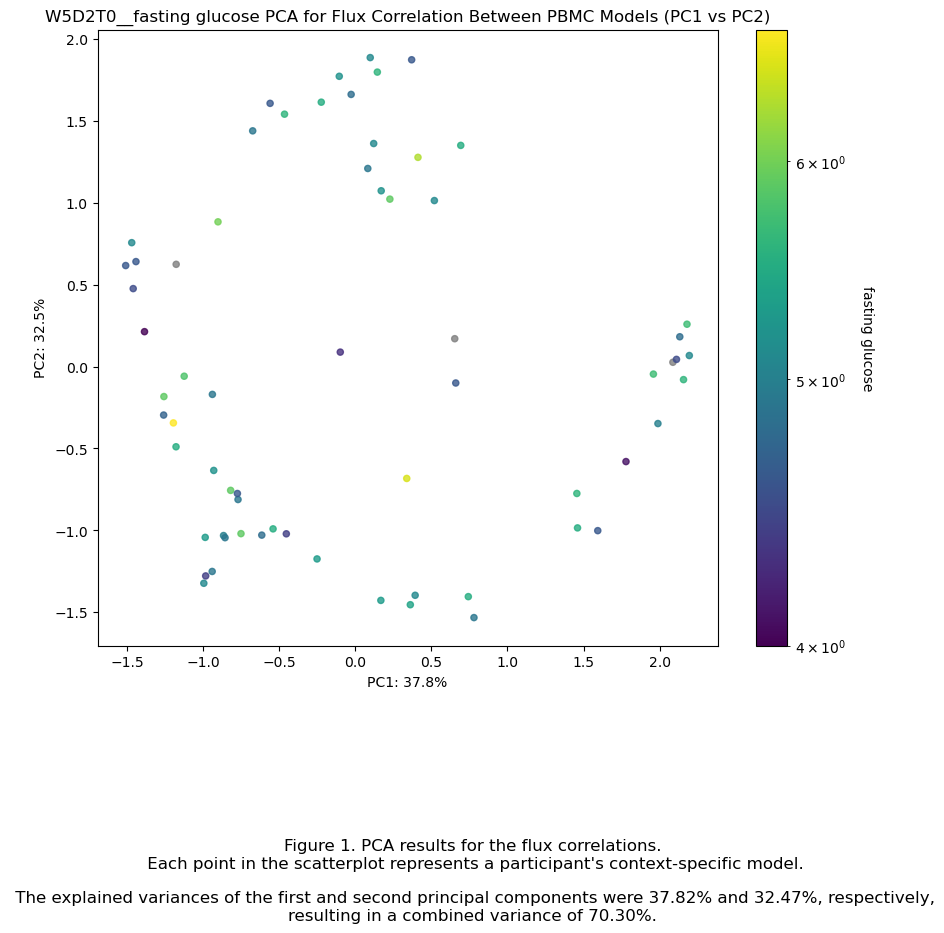

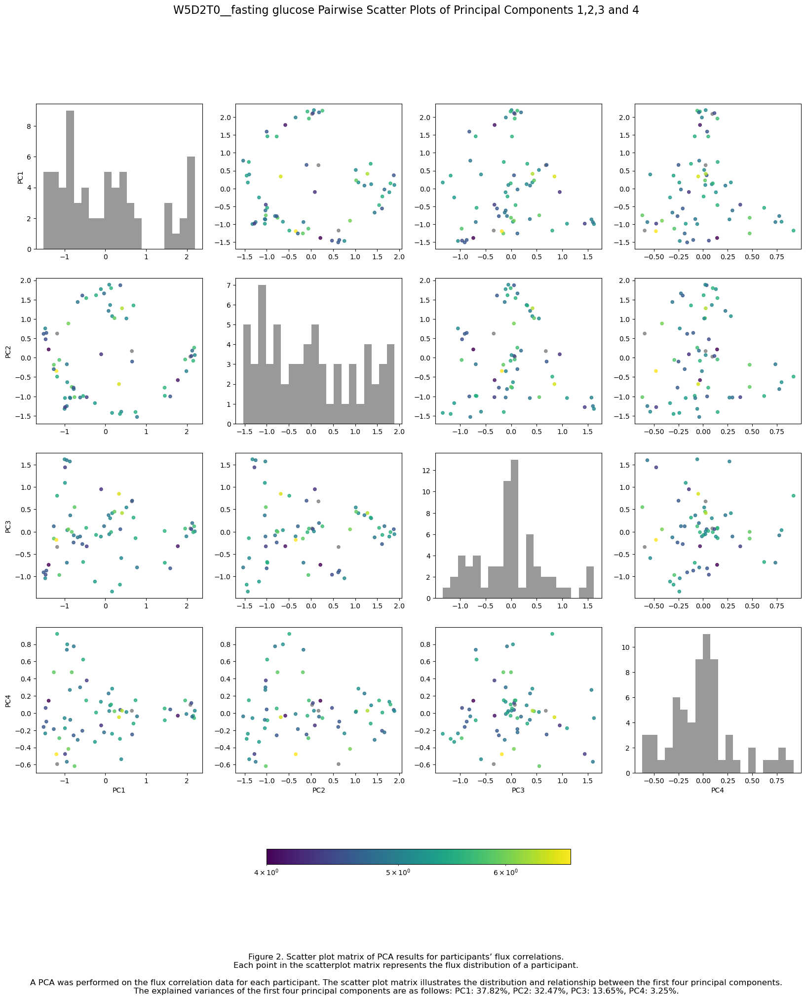

[0.37824503 0.32473143 0.13652004]


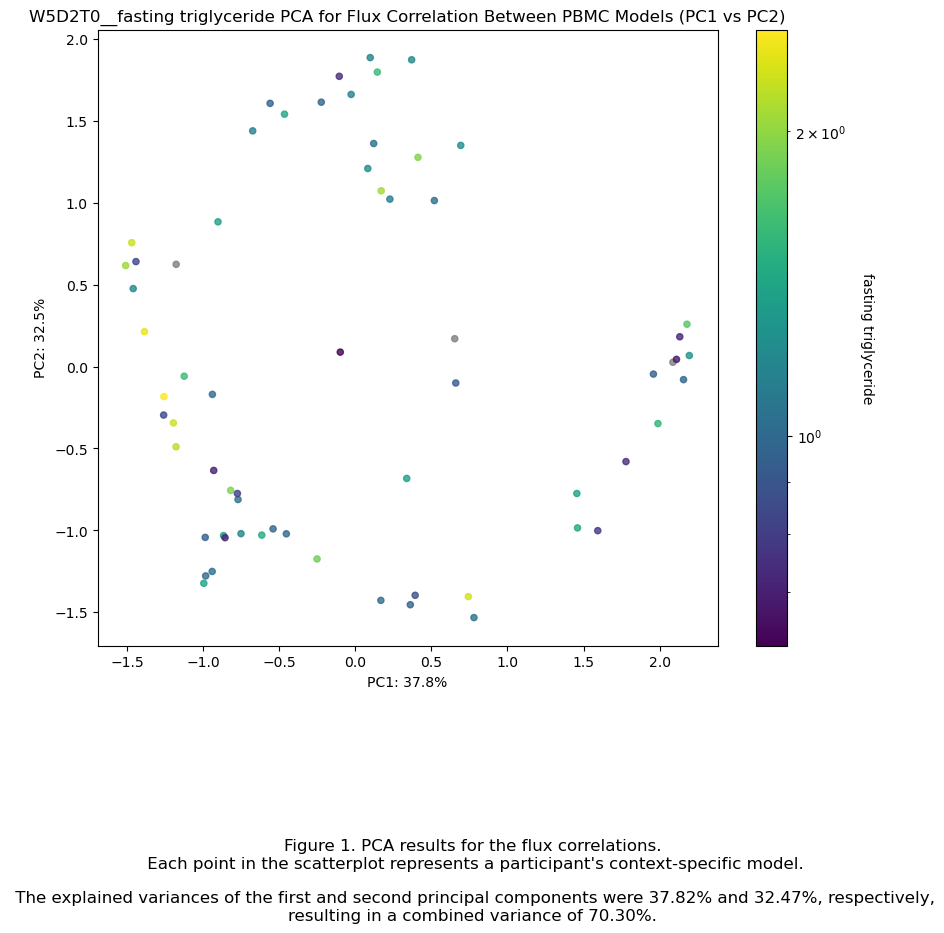

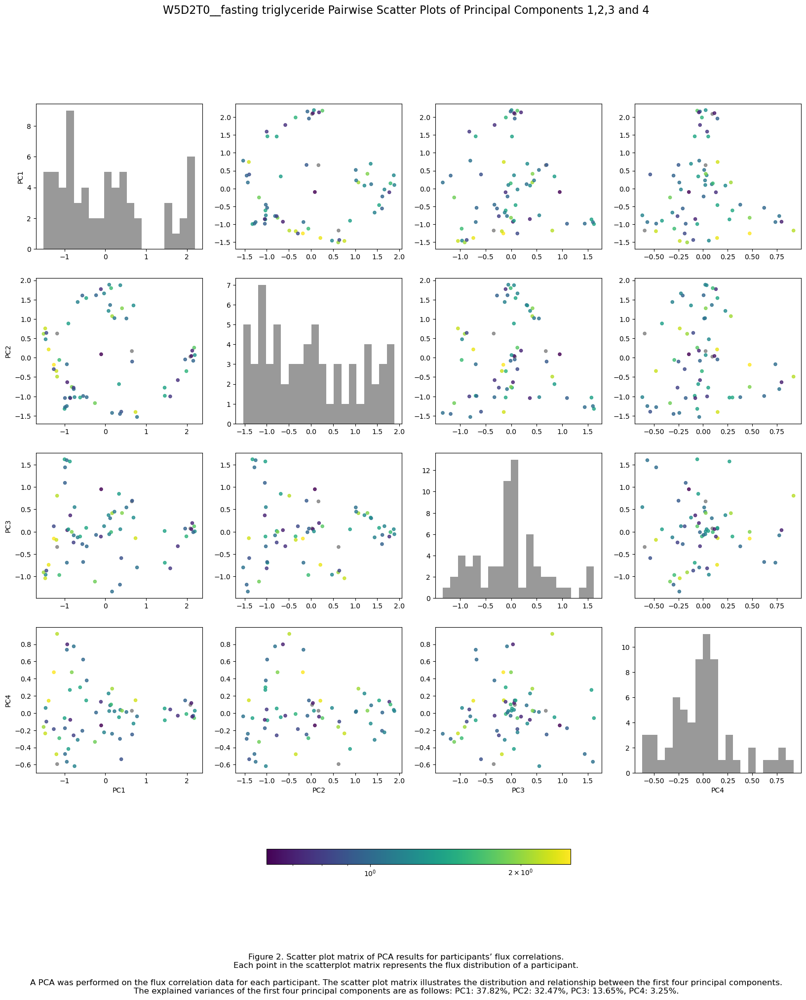

[0.37824503 0.32473143 0.13652004]


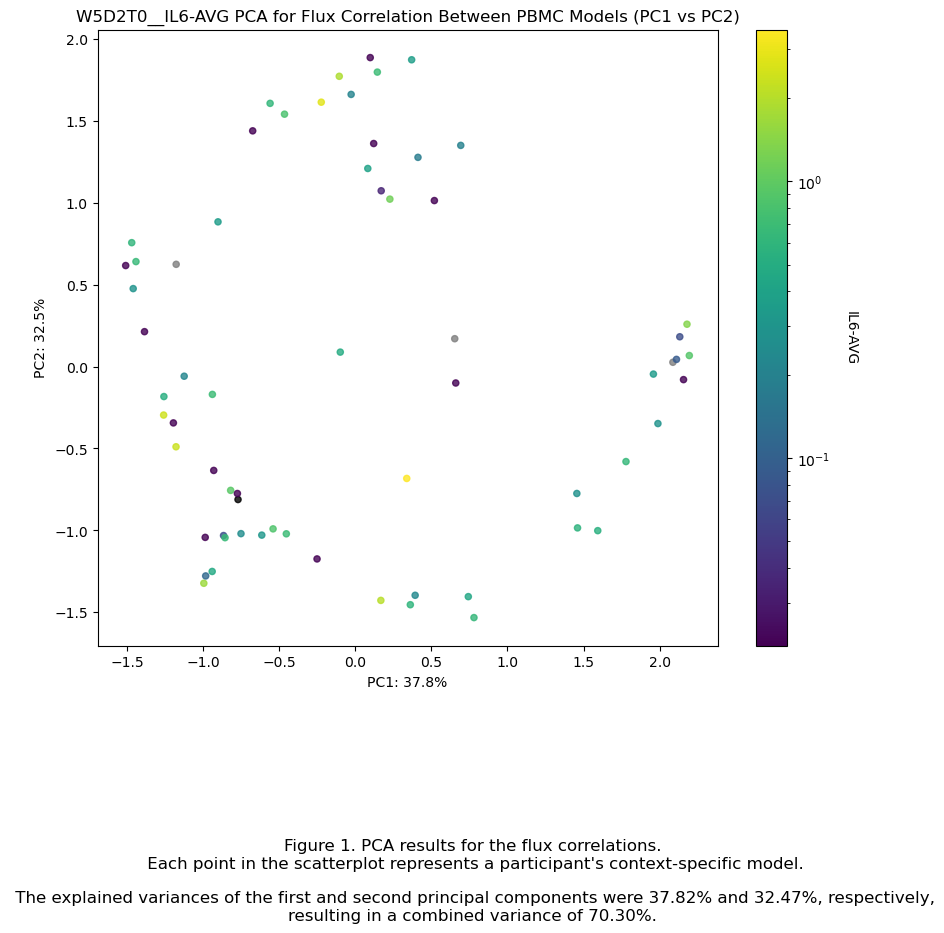

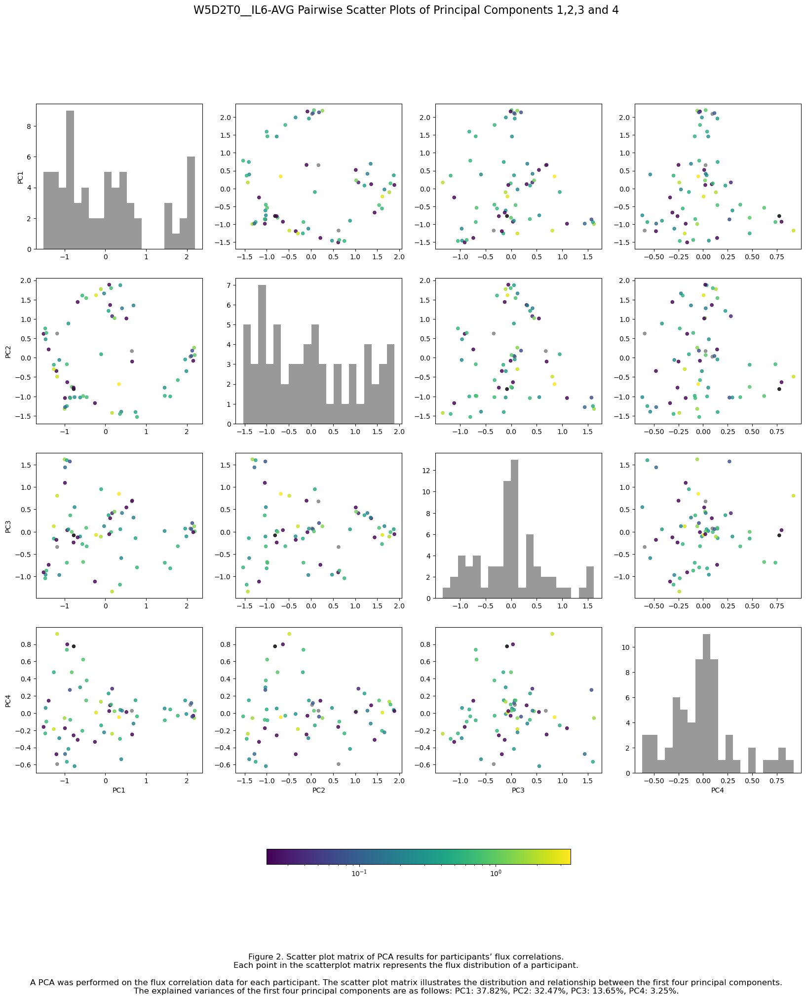

[0.37824503 0.32473143 0.13652004]


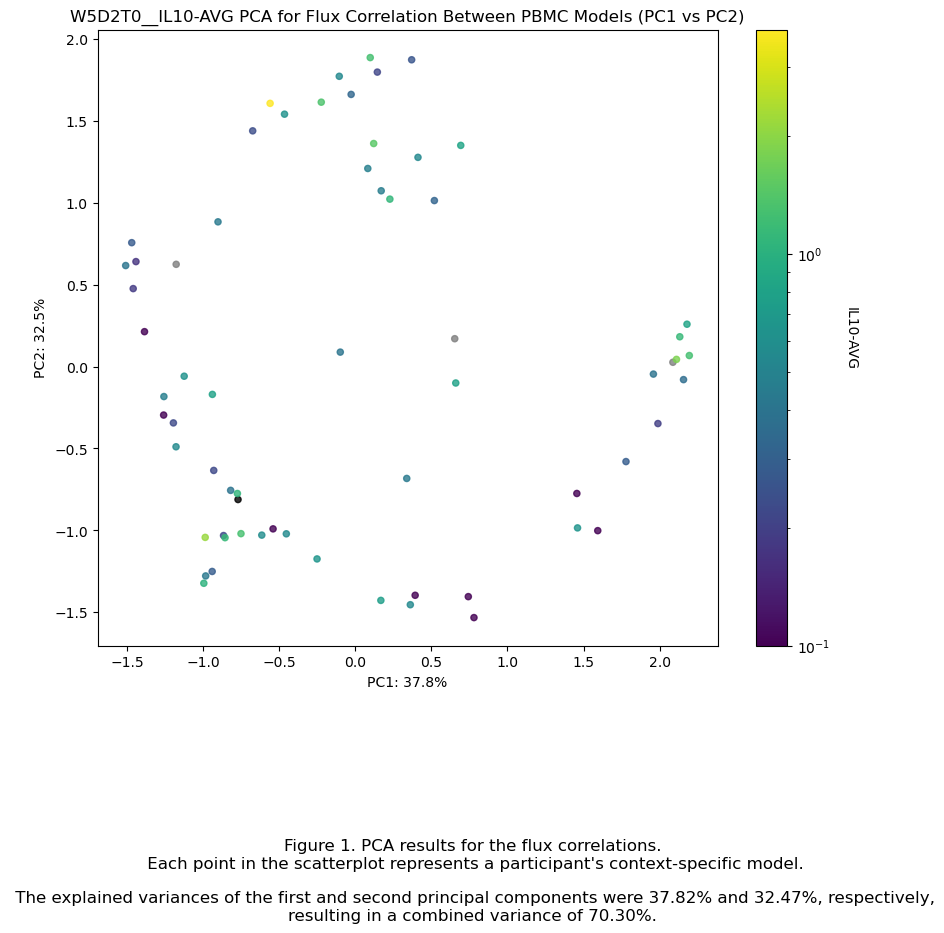

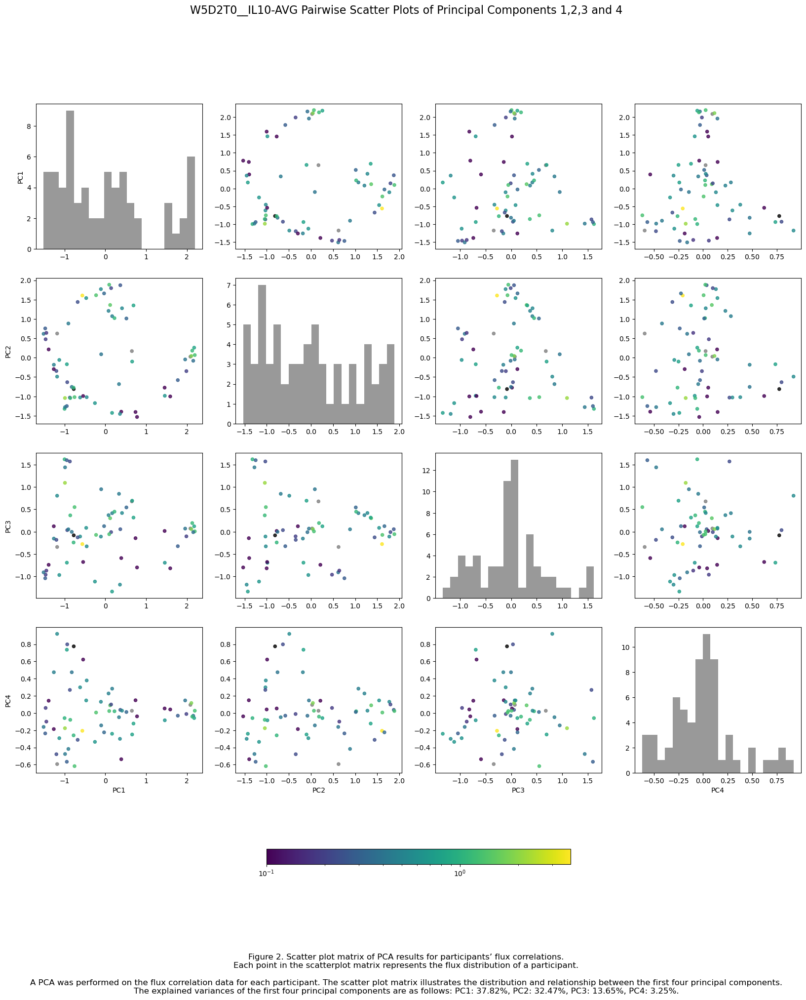

[0.37824503 0.32473143 0.13652004]


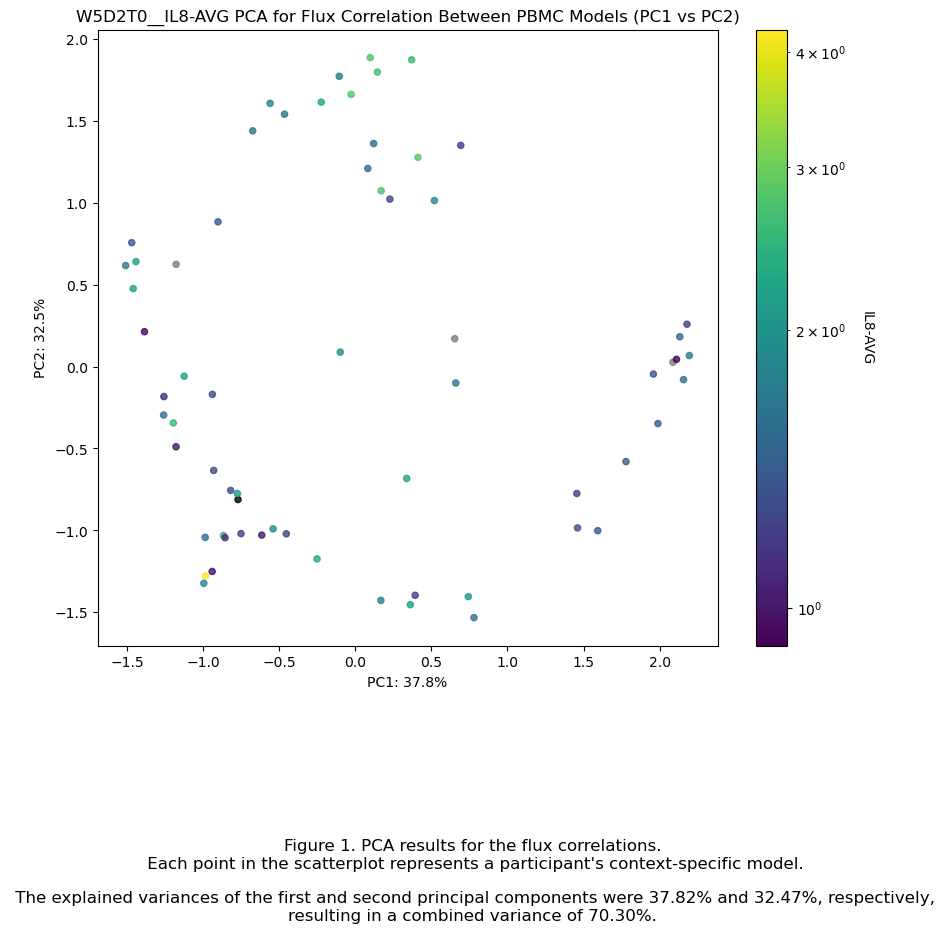

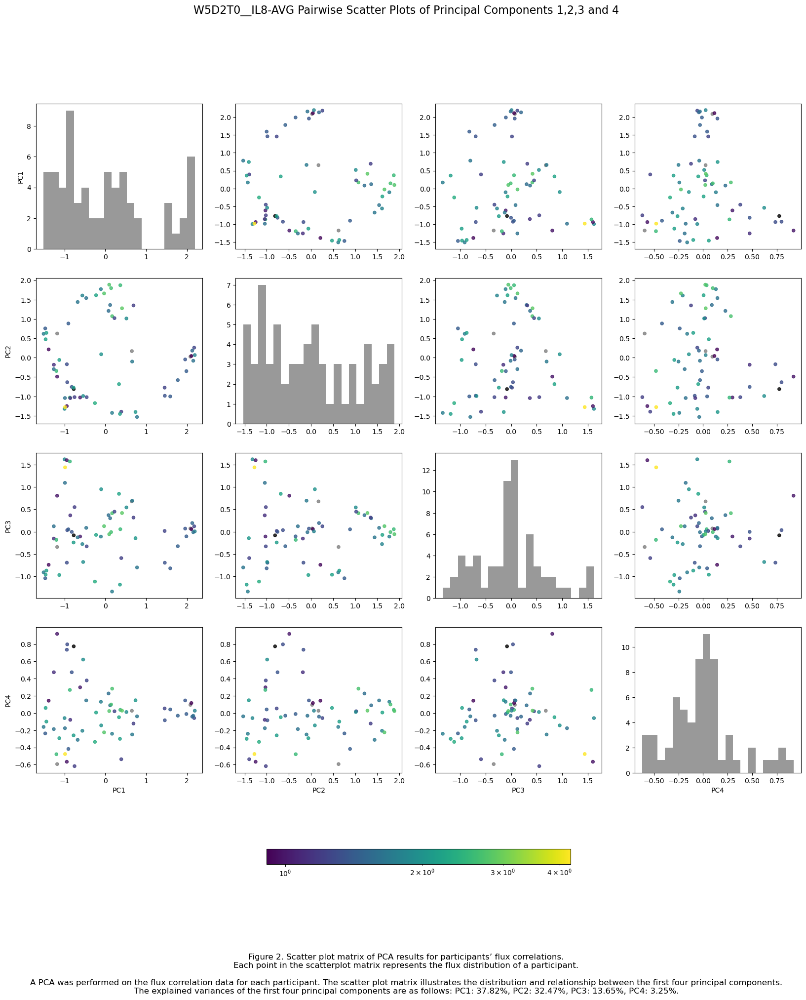

[0.37824503 0.32473143 0.13652004]


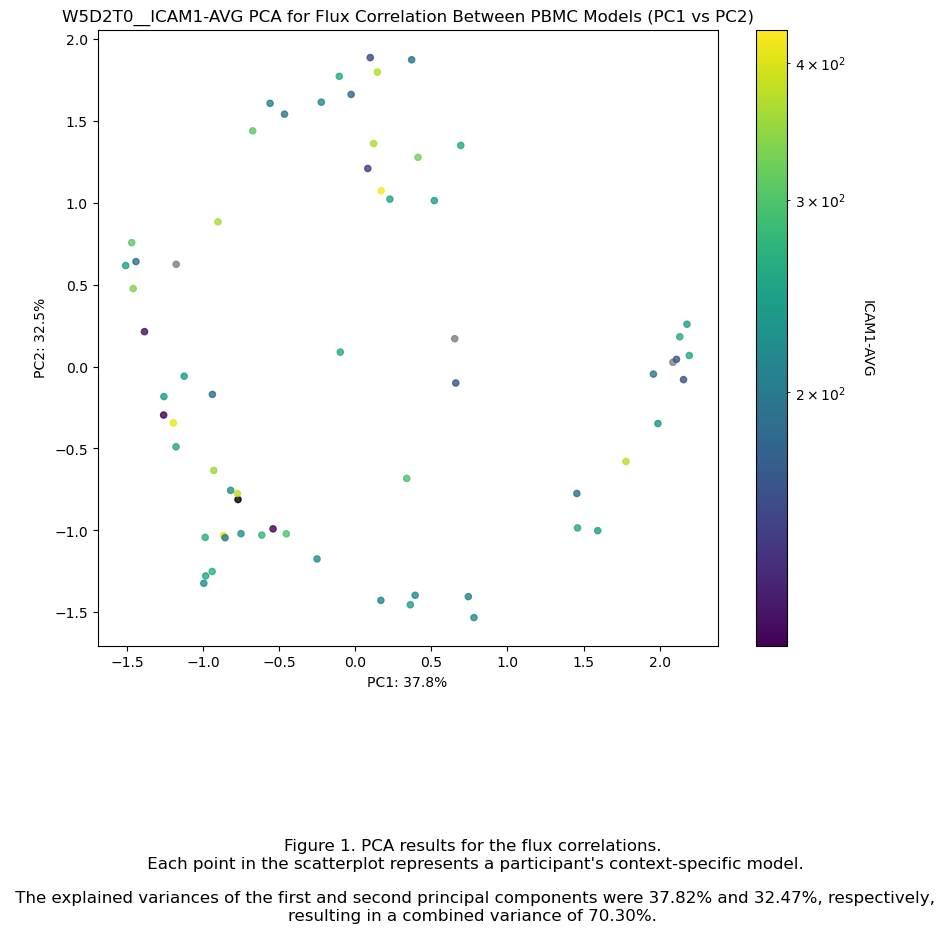

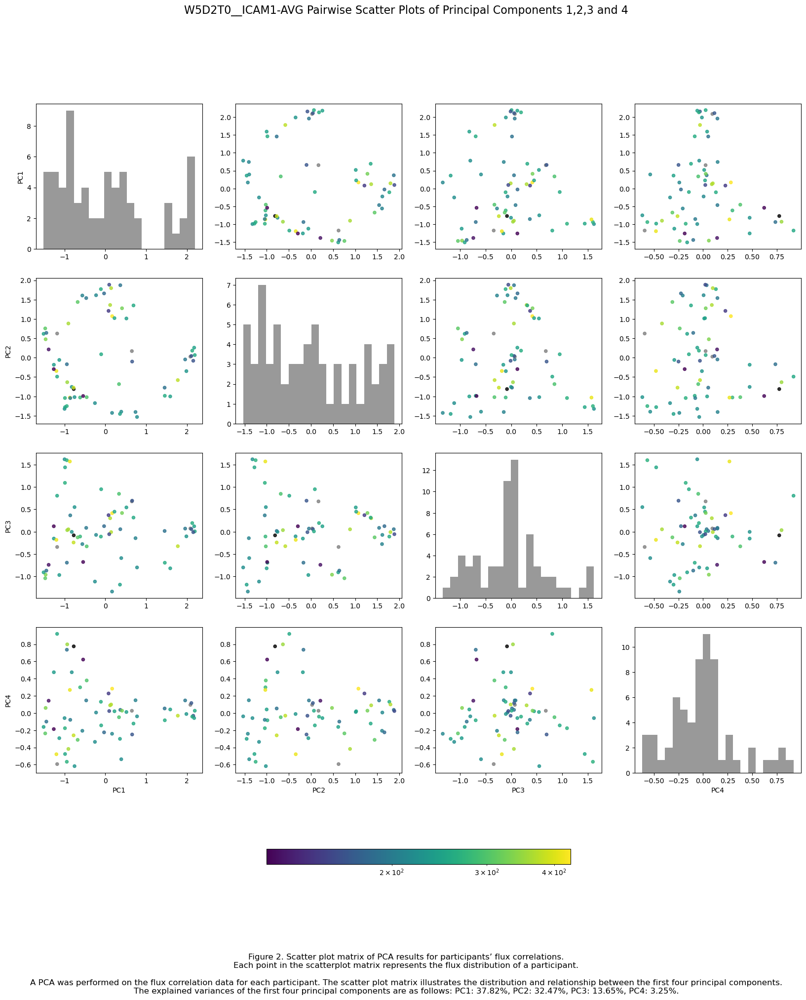

[0.37824503 0.32473143 0.13652004]


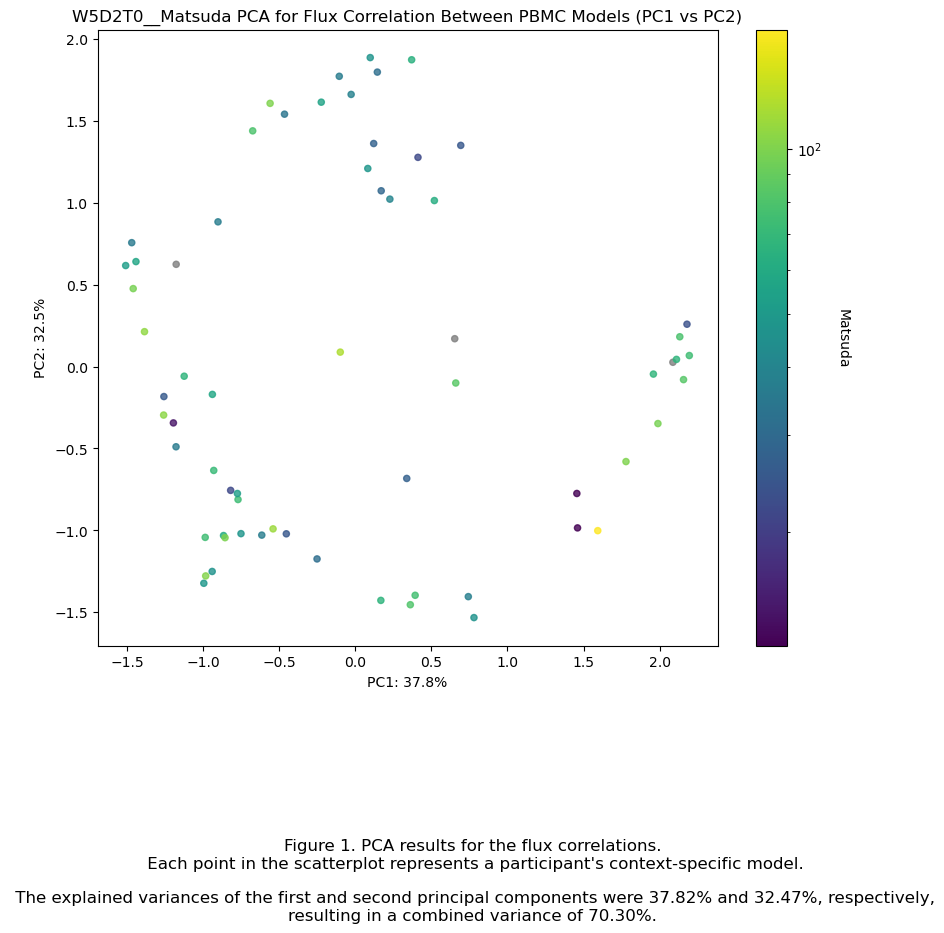

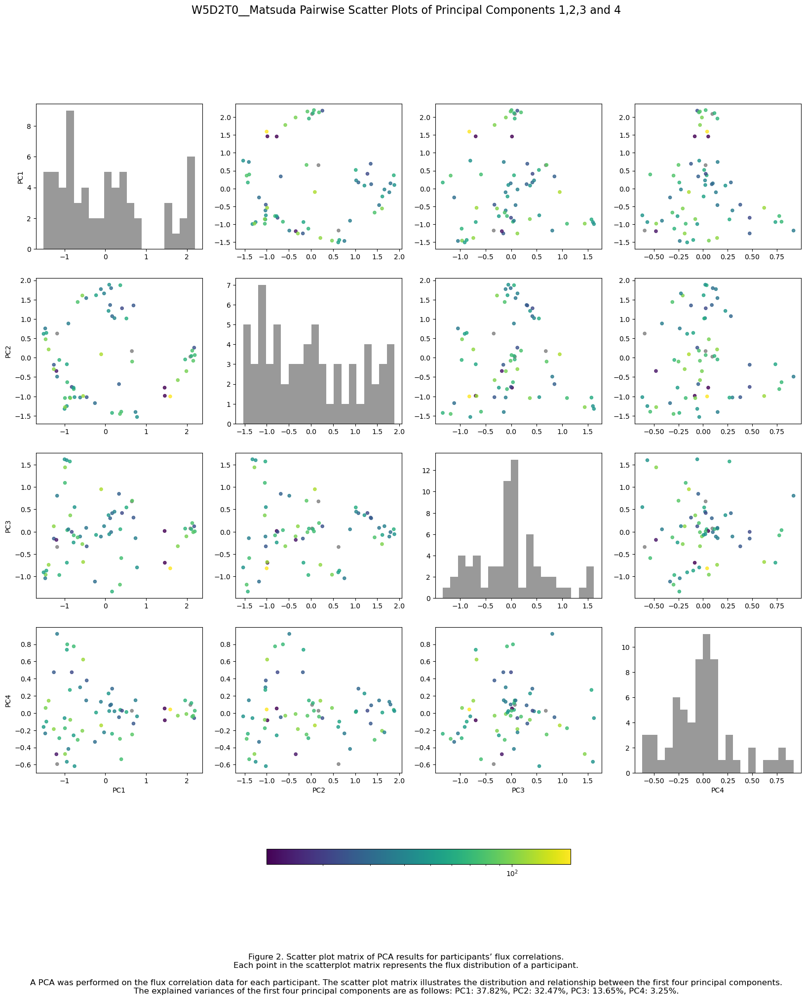

[0.37824503 0.32473143 0.13652004]


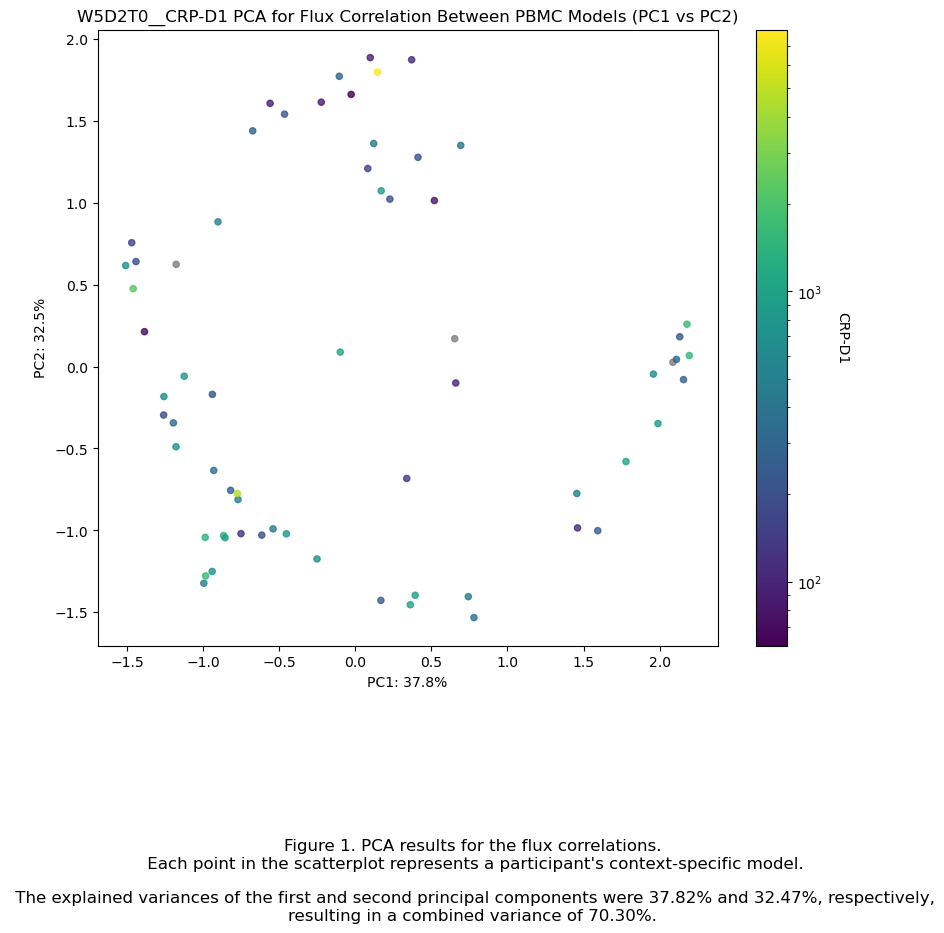

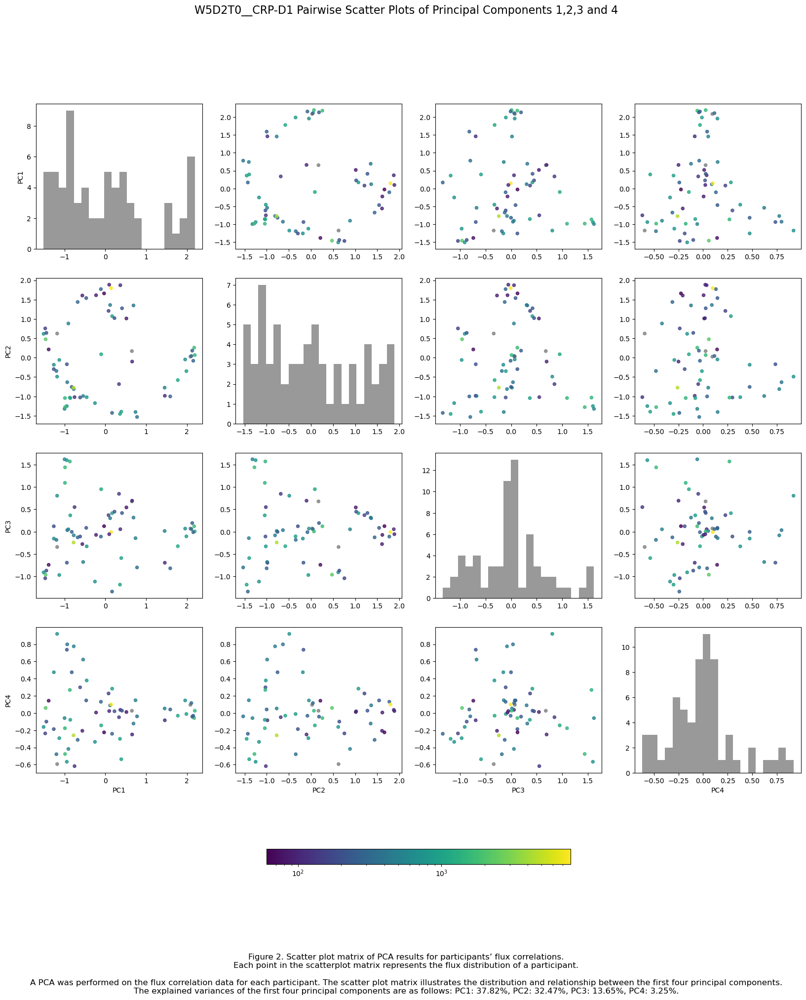

In [6]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm

# Set the file_ID for naming plots and saved figures
file_ID = 'W5D2T0_'
pw_flx1 = pd.read_csv('pw_flx1.csv')
columns_to_compare = [ 'fasting glucose', 'fasting triglyceride', 'IL6-AVG', 'IL10-AVG', 'IL8-AVG',
                      'ICAM1-AVG', 'Matsuda', 'CRP-D1' ]

# Load the entire Excel file
file_path = '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 13/NutriTech_otherdata_AVG.xlsx'
xls = pd.ExcelFile(file_path)

# Print the sheet names to see what sheets are available
print(xls.sheet_names)

# Load a sheet into a DataFrame by sheet name
df_week5_before = pd.read_excel(xls, sheet_name='week5_before_intervention', header=1)

# Extract the participant IDs from NutriTech data (assuming they are in 'name' column)
nutritech_ids = df_week5_before['name'].tolist()
# Extract the participant IDs from pw_flx1.csv column names
pw_flx1_ids = pw_flx1.columns.str.extract(r'(NT\d+)_')[0]

# Initialize lists to capture missing IDs and unmatched columns
missing_ids = []
unmatched_columns = pw_flx1.columns.tolist()

# Map the NutriTech IDs to the corresponding columns in pw_flx1.csv
mapping = {}
for nt_id in nutritech_ids:
    if nt_id in pw_flx1_ids.values:
        matched_column = pw_flx1.columns[pw_flx1_ids[pw_flx1_ids == nt_id].index[0]]
        mapping[nt_id] = matched_column
        unmatched_columns.remove(matched_column)
    else:
        missing_ids.append(nt_id)

# Print results
print("Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:")
print(mapping)

if missing_ids:
    print("\nWarning: The following NutriTech IDs were not found in pw_flx1.csv:")
    print(missing_ids)

if unmatched_columns:
    print("\nWarning: The following columns in pw_flx1.csv did not match any NutriTech IDs:")
    print(unmatched_columns)

for NT_data in columns_to_compare:
    # Extract corresponding labels (numeric values) for the columns in pw_flx1.csv based on the mapping
    pca_labels = []
    for column in pw_flx1.columns:
        matched_id = next((key for key, value in mapping.items() if value == column), None)
        if matched_id:
            label = df_week5_before.loc[df_week5_before['name'] == matched_id, NT_data].values[0]
            pca_labels.append(label)
        else:
            pca_labels.append(np.nan)  # Handle missing data
            

    # Convert pca_labels to a numpy array for easier handling
    pca_labels = np.array(pca_labels)

    # Filter out non-finite and zero values before setting up LogNorm
    finite_labels = pca_labels[np.isfinite(pca_labels) & (pca_labels > 0)]
    
    # Normalize pca_labels for color mapping with LogNorm
    norm = LogNorm(vmin=finite_labels.min(), vmax=finite_labels.max())

    cmap = plt.cm.viridis  # You can choose any colormap

    # Define a color array: use cmap for valid data and grey for NaN or zero values
    colors = np.array([cmap(norm(val)) if np.isfinite(val) and val > 0 else (0.5, 0.5, 0.5, 1.0) for val in pca_labels])

    # Perform PCA
    pca = PCA(n_components=3)
    pcaData = pca.fit_transform(pw_flx1.T)  # Transpose to make samples as rows
    print(pca.explained_variance_ratio_)

    
    colors = np.array([cmap(norm(val)) if not np.isnan(val) else (0.5, 0.5, 0.5, 1.0) for val in pca_labels])

    title_font = {
        'weight': 'medium',
        'size': 12,
    }
    axis_font = {
        'weight': 'normal',
        'size': 10,
    }

    # Plot PCA scatter plot with color gradient
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 8))
    sc = plt.scatter(pcaData[:, 0], pcaData[:, 1], s=20, marker='o', color=colors, alpha=0.8)

    # Add color bar for non-NaN values only
    valid_sc = plt.scatter([], [], c=[], cmap=cmap, norm=norm)
    cbar = plt.colorbar(valid_sc)
    cbar.set_label(f'{NT_data}', rotation=270, labelpad=20)

    plt.title(f'{file_ID}_{NT_data} PCA for Flux Correlation Between PBMC Models (PC1 vs PC2)', title_font)
    plt.xlabel('PC1: {:.1%}'.format(pca.explained_variance_ratio_[0]), axis_font)
    plt.ylabel('PC2: {:.1%}'.format(pca.explained_variance_ratio_[1]), axis_font)
    plt.figtext(0.5, -0.23, (f'Figure 1. PCA results for the flux correlations.\n Each point in the scatterplot represents a participant\'s context-specific model.\n\n The explained variances of the first and second principal components were {pca.explained_variance_ratio_[0]*100:.2f}% and {pca.explained_variance_ratio_[1]*100:.2f}%, respectively, resulting in a combined variance of {((pca.explained_variance_ratio_[0]*100)+(pca.explained_variance_ratio_[1]*100)):.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
    #plt.savefig(f'{file_ID}fig.1_{NT_data}_PCA_for_Flux_Correlation.png', dpi=1000)

    ####################### Create a 4x4 plot matrix of PC1, PC2, PC3, and PC4
    # Perform PCA
    pca = PCA(n_components=4)
    pcaData = pca.fit_transform(pw_flx1.T)
    explained_variance = pca.explained_variance_ratio_

    fig, axs = plt.subplots(4, 4, figsize=(20, 20))

    pc_labels = ['PC1', 'PC2', 'PC3', 'PC4']
    components = [pcaData[:, 0], pcaData[:, 1], pcaData[:, 2], pcaData[:, 3]]

    for i in range(4):
        for j in range(4):
            if i == j:
                axs[i, j].hist(components[i], bins=20, color='gray', alpha=0.8)  # Histogram does not need color mapping
            else:
                sc = axs[i, j].scatter(components[j], components[i], color=colors, s=20, alpha=0.8)
            if i == 3:
                axs[i, j].set_xlabel(pc_labels[j])
            if j == 0:
                axs[i, j].set_ylabel(pc_labels[i])

    # Add a shared color bar
    fig.colorbar(valid_sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.1)

    plt.suptitle(f'{file_ID}_{NT_data} Pairwise Scatter Plots of Principal Components 1,2,3 and 4', fontsize=16, weight='medium')
    plt.figtext(0.5, -0.02, (f'Figure 2. Scatter plot matrix of PCA results for participants’ flux correlations.\n'
                             f'Each point in the scatterplot matrix represents the flux distribution of a participant.\n\n'
                             f'A PCA was performed on the flux correlation data for each participant. The scatter plot matrix illustrates the distribution and relationship between the first four principal components.\n'
                             f'The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)

    plt.savefig(f'{file_ID}fig.2_{NT_data}_Pairwise_Scatter_Plots_of_PC1_to_PC4.png', dpi=1000)
    plt.show()


# W5D2T120, Nutritech data + colour gradient

['week5_before_intervention', 'week13_after_intervention']
Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:
{'NT001': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D2T120/NT001_W5D2T120', 'NT002': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D2T120/NT002_W5D2T120', 'NT006': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D2T120/NT006_W5D2T120', 'NT008': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork

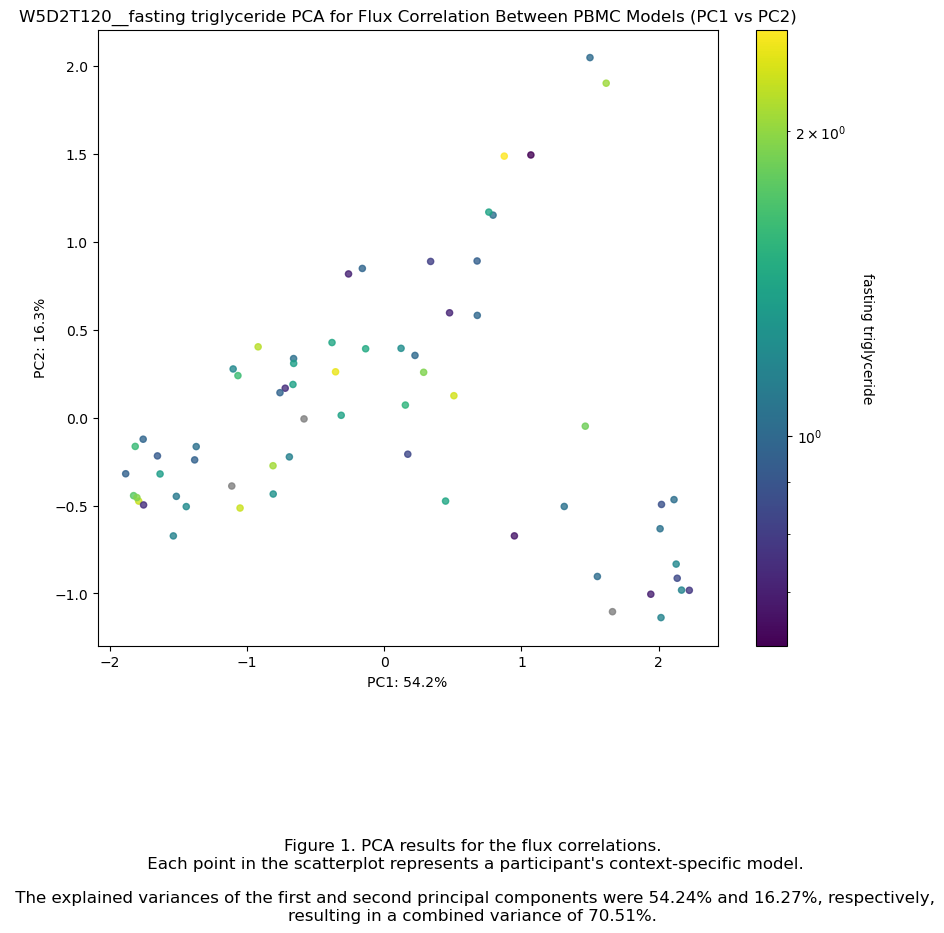

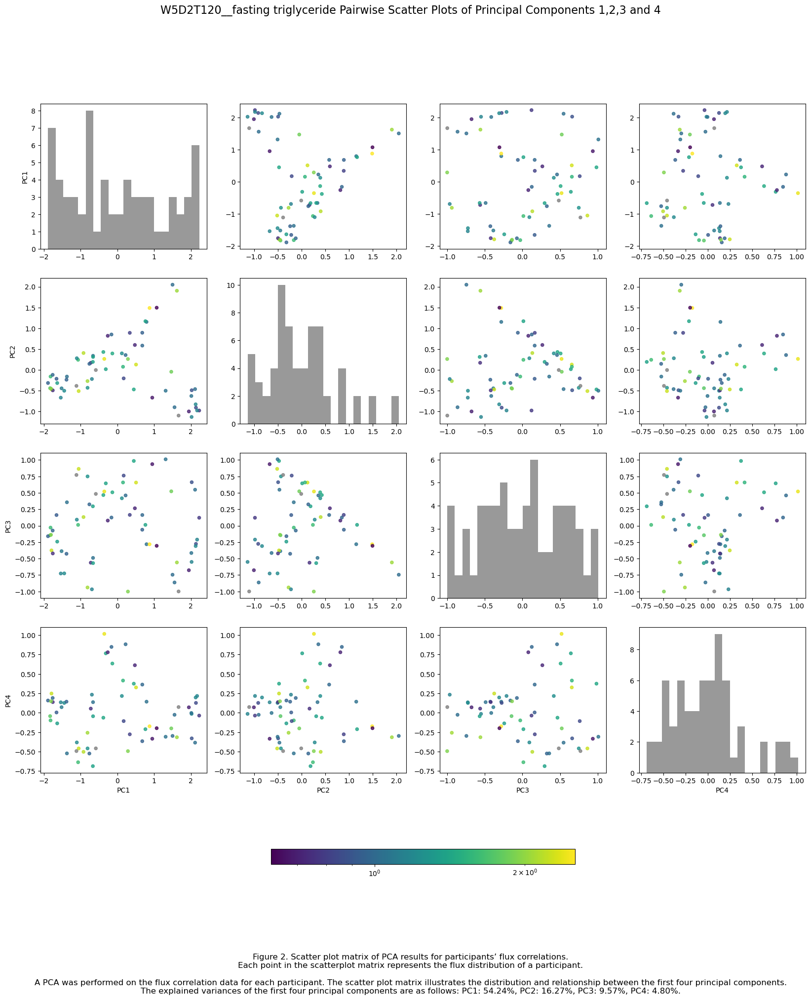

[0.54239113 0.16269086 0.09566434]


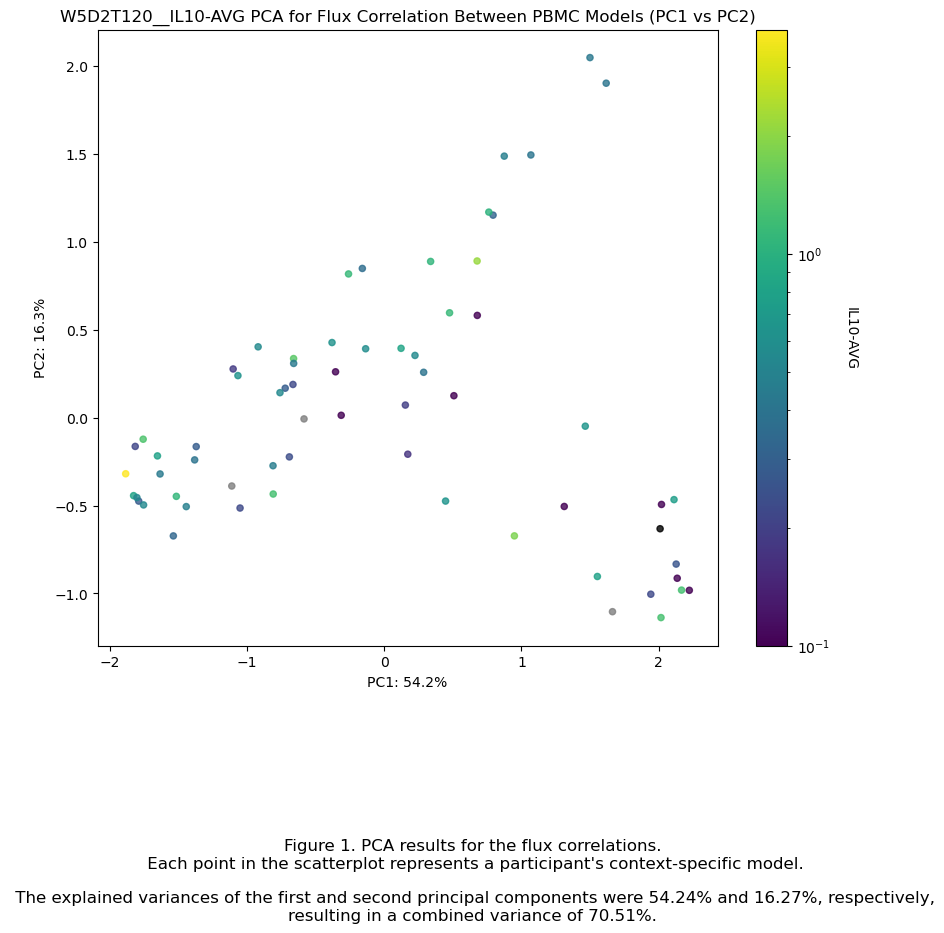

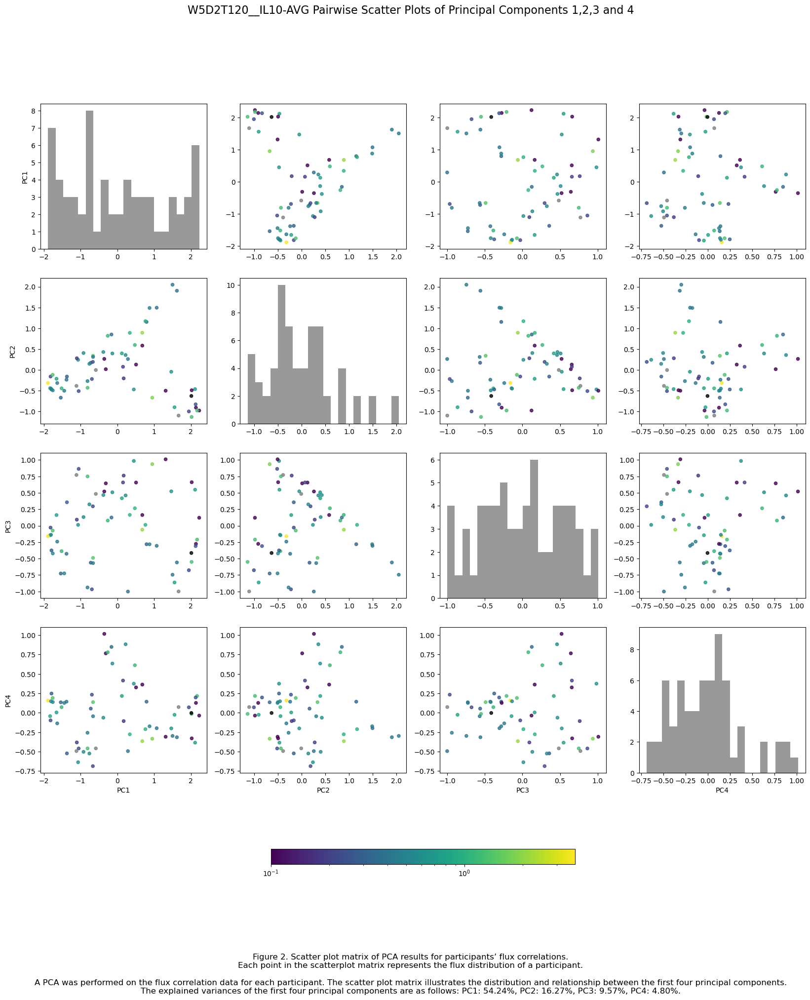

[0.54239113 0.16269086 0.09566434]


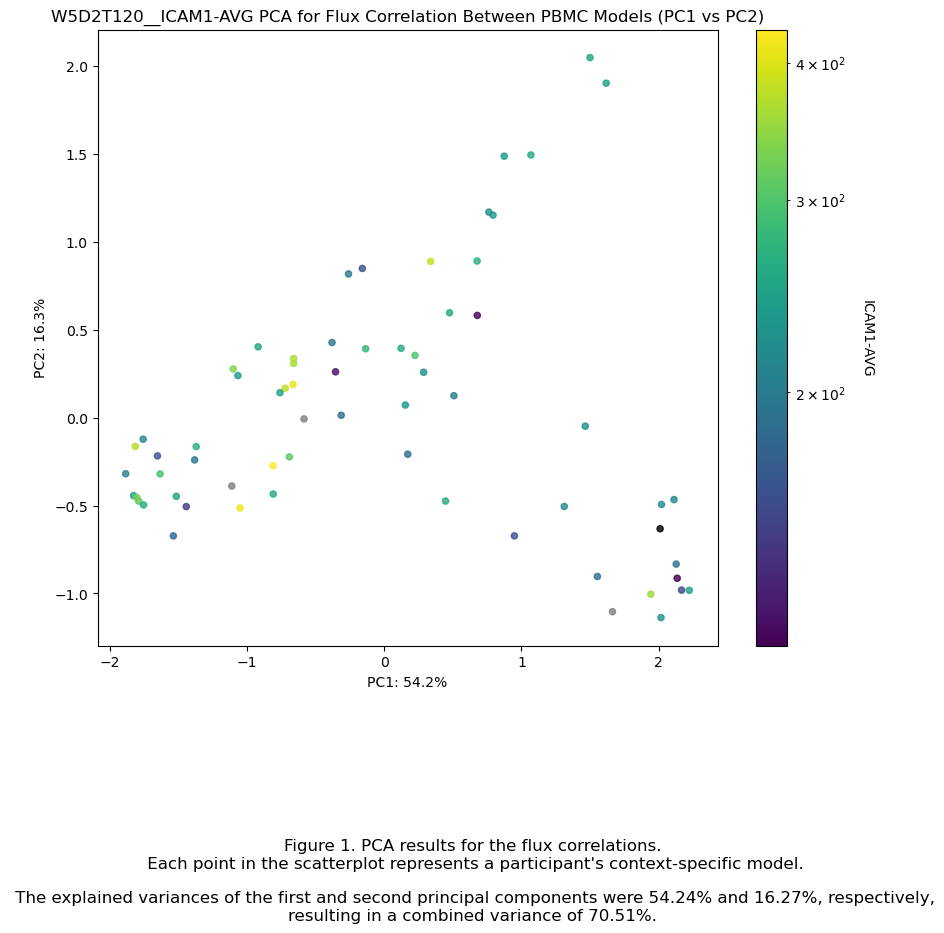

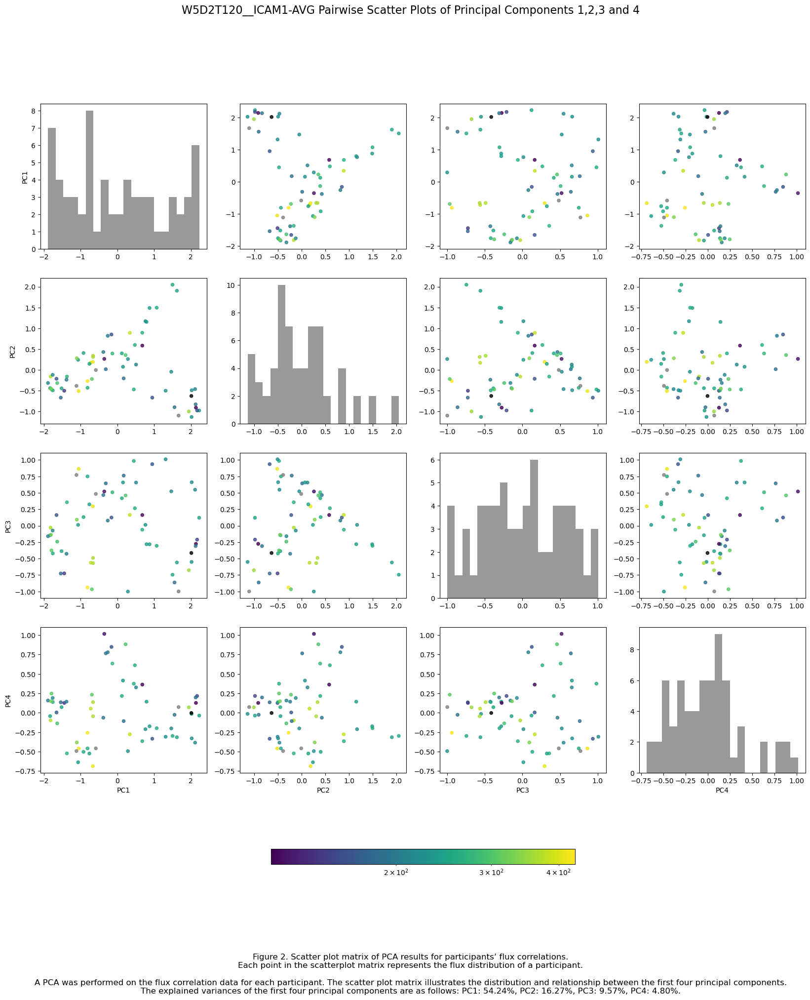

[0.54239113 0.16269086 0.09566434]


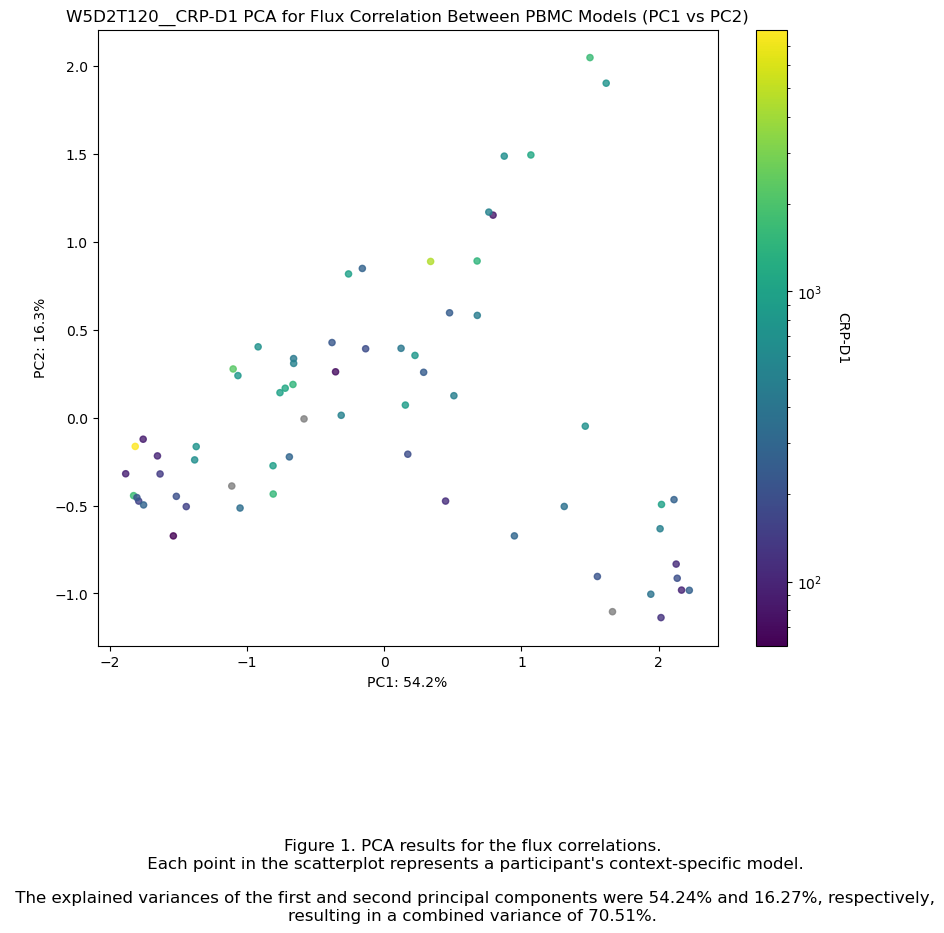

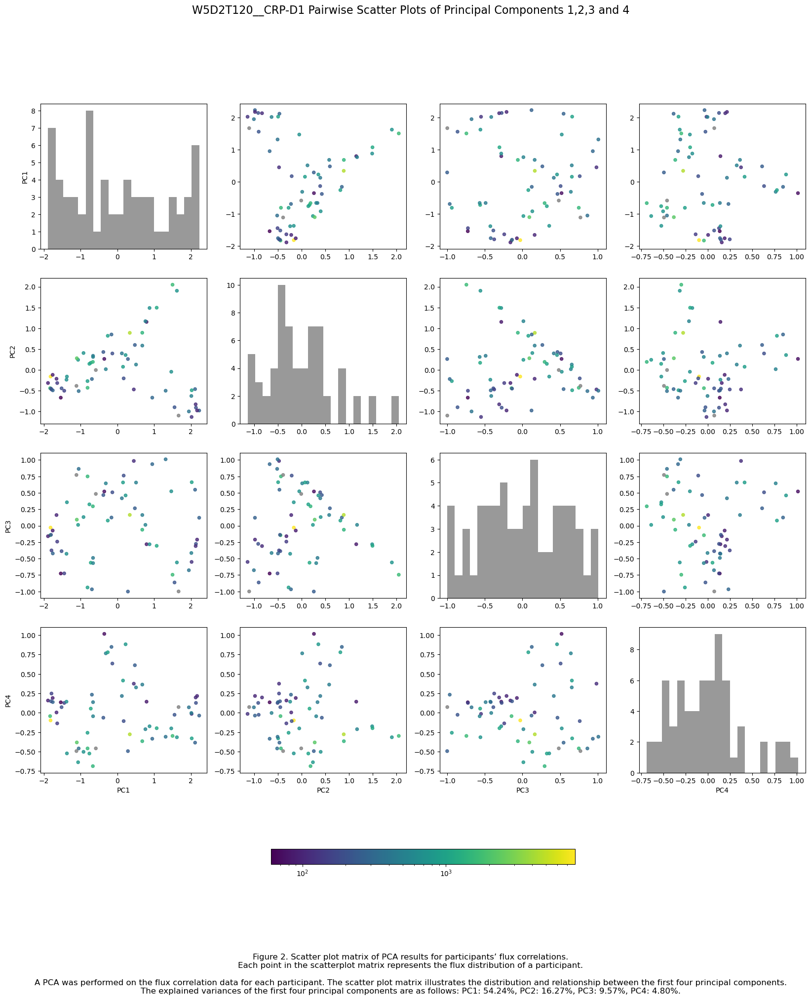

In [7]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Set the file_ID for naming plots and saved figures
file_ID = 'W5D2T120_'
pw_flx1 = pd.read_csv('pw_flx2.csv')
columns_to_compare = [ 'fasting triglyceride', 'IL10-AVG',  'ICAM1-AVG',  'CRP-D1' ]

# Load the entire Excel file
file_path = '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 13/NutriTech_otherdata_AVG.xlsx'
xls = pd.ExcelFile(file_path)

# Print the sheet names to see what sheets are available
print(xls.sheet_names)

# Load a sheet into a DataFrame by sheet name
df_week5_before = pd.read_excel(xls, sheet_name='week5_before_intervention', header=1)

# Extract the participant IDs from NutriTech data (assuming they are in 'name' column)
nutritech_ids = df_week5_before['name'].tolist()
# Extract the participant IDs from pw_flx1.csv column names
pw_flx1_ids = pw_flx1.columns.str.extract(r'(NT\d+)_')[0]

# Initialize lists to capture missing IDs and unmatched columns
missing_ids = []
unmatched_columns = pw_flx1.columns.tolist()

# Map the NutriTech IDs to the corresponding columns in pw_flx1.csv
mapping = {}
for nt_id in nutritech_ids:
    if nt_id in pw_flx1_ids.values:
        matched_column = pw_flx1.columns[pw_flx1_ids[pw_flx1_ids == nt_id].index[0]]
        mapping[nt_id] = matched_column
        unmatched_columns.remove(matched_column)
    else:
        missing_ids.append(nt_id)

# Print results
print("Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:")
print(mapping)

if missing_ids:
    print("\nWarning: The following NutriTech IDs were not found in pw_flx1.csv:")
    print(missing_ids)

if unmatched_columns:
    print("\nWarning: The following columns in pw_flx1.csv did not match any NutriTech IDs:")
    print(unmatched_columns)

for NT_data in columns_to_compare:
    # Extract corresponding labels (numeric values) for the columns in pw_flx1.csv based on the mapping
    pca_labels = []
    for column in pw_flx1.columns:
        matched_id = next((key for key, value in mapping.items() if value == column), None)
        if matched_id:
            label = df_week5_before.loc[df_week5_before['name'] == matched_id, NT_data].values[0]
            pca_labels.append(label)
        else:
            pca_labels.append(np.nan)  # Handle missing data
            

    # Convert pca_labels to a numpy array for easier handling
    pca_labels = np.array(pca_labels)

    # Filter out non-finite and zero values before setting up LogNorm
    finite_labels = pca_labels[np.isfinite(pca_labels) & (pca_labels > 0)]
    
    # Normalize pca_labels for color mapping with LogNorm
    norm = LogNorm(vmin=finite_labels.min(), vmax=finite_labels.max())

    cmap = plt.cm.viridis  # You can choose any colormap

    # Define a color array: use cmap for valid data and grey for NaN or zero values
    colors = np.array([cmap(norm(val)) if np.isfinite(val) and val > 0 else (0.5, 0.5, 0.5, 1.0) for val in pca_labels])

    # Perform PCA
    pca = PCA(n_components=3)
    pcaData = pca.fit_transform(pw_flx1.T)  # Transpose to make samples as rows
    print(pca.explained_variance_ratio_)

    
    colors = np.array([cmap(norm(val)) if not np.isnan(val) else (0.5, 0.5, 0.5, 1.0) for val in pca_labels])

    title_font = {
        'weight': 'medium',
        'size': 12,
    }
    axis_font = {
        'weight': 'normal',
        'size': 10,
    }

    # Plot PCA scatter plot with color gradient
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 8))
    sc = plt.scatter(pcaData[:, 0], pcaData[:, 1], s=20, marker='o', color=colors, alpha=0.8)

    # Add color bar for non-NaN values only
    valid_sc = plt.scatter([], [], c=[], cmap=cmap, norm=norm)
    cbar = plt.colorbar(valid_sc)
    cbar.set_label(f'{NT_data}', rotation=270, labelpad=20)

    plt.title(f'{file_ID}_{NT_data} PCA for Flux Correlation Between PBMC Models (PC1 vs PC2)', title_font)
    plt.xlabel('PC1: {:.1%}'.format(pca.explained_variance_ratio_[0]), axis_font)
    plt.ylabel('PC2: {:.1%}'.format(pca.explained_variance_ratio_[1]), axis_font)
    plt.figtext(0.5, -0.23, (f'Figure 1. PCA results for the flux correlations.\n Each point in the scatterplot represents a participant\'s context-specific model.\n\n The explained variances of the first and second principal components were {pca.explained_variance_ratio_[0]*100:.2f}% and {pca.explained_variance_ratio_[1]*100:.2f}%, respectively, resulting in a combined variance of {((pca.explained_variance_ratio_[0]*100)+(pca.explained_variance_ratio_[1]*100)):.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
    #plt.savefig(f'{file_ID}fig.1_{NT_data}_PCA_for_Flux_Correlation.png', dpi=1000)

    ####################### Create a 4x4 plot matrix of PC1, PC2, PC3, and PC4
    # Perform PCA
    pca = PCA(n_components=4)
    pcaData = pca.fit_transform(pw_flx1.T)
    explained_variance = pca.explained_variance_ratio_

    fig, axs = plt.subplots(4, 4, figsize=(20, 20))

    pc_labels = ['PC1', 'PC2', 'PC3', 'PC4']
    components = [pcaData[:, 0], pcaData[:, 1], pcaData[:, 2], pcaData[:, 3]]

    for i in range(4):
        for j in range(4):
            if i == j:
                axs[i, j].hist(components[i], bins=20, color='gray', alpha=0.8)  # Histogram does not need color mapping
            else:
                sc = axs[i, j].scatter(components[j], components[i], color=colors, s=20, alpha=0.8)
            if i == 3:
                axs[i, j].set_xlabel(pc_labels[j])
            if j == 0:
                axs[i, j].set_ylabel(pc_labels[i])

    # Add a shared color bar
    fig.colorbar(valid_sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.1)

    plt.suptitle(f'{file_ID}_{NT_data} Pairwise Scatter Plots of Principal Components 1,2,3 and 4', fontsize=16, weight='medium')
    plt.figtext(0.5, -0.02, (f'Figure 2. Scatter plot matrix of PCA results for participants’ flux correlations.\n'
                             f'Each point in the scatterplot matrix represents the flux distribution of a participant.\n\n'
                             f'A PCA was performed on the flux correlation data for each participant. The scatter plot matrix illustrates the distribution and relationship between the first four principal components.\n'
                             f'The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)

    plt.savefig(f'{file_ID}fig.2_{NT_data}_Pairwise_Scatter_Plots_of_PC1_to_PC4.png', dpi=1000)
    plt.show()


# W5D3T0, code from docs, FBA = true

['week5_before_intervention', 'week13_after_intervention']

['NT009', 'NT032', 'NT038', 'NT041', 'NT055', 'NT065', 'NT072', 'NT078', 'NT080', 'NT089', 'NT104', 'NT125', 'NT147', 'NT151']

[0.36762544 0.25403733 0.08680735]


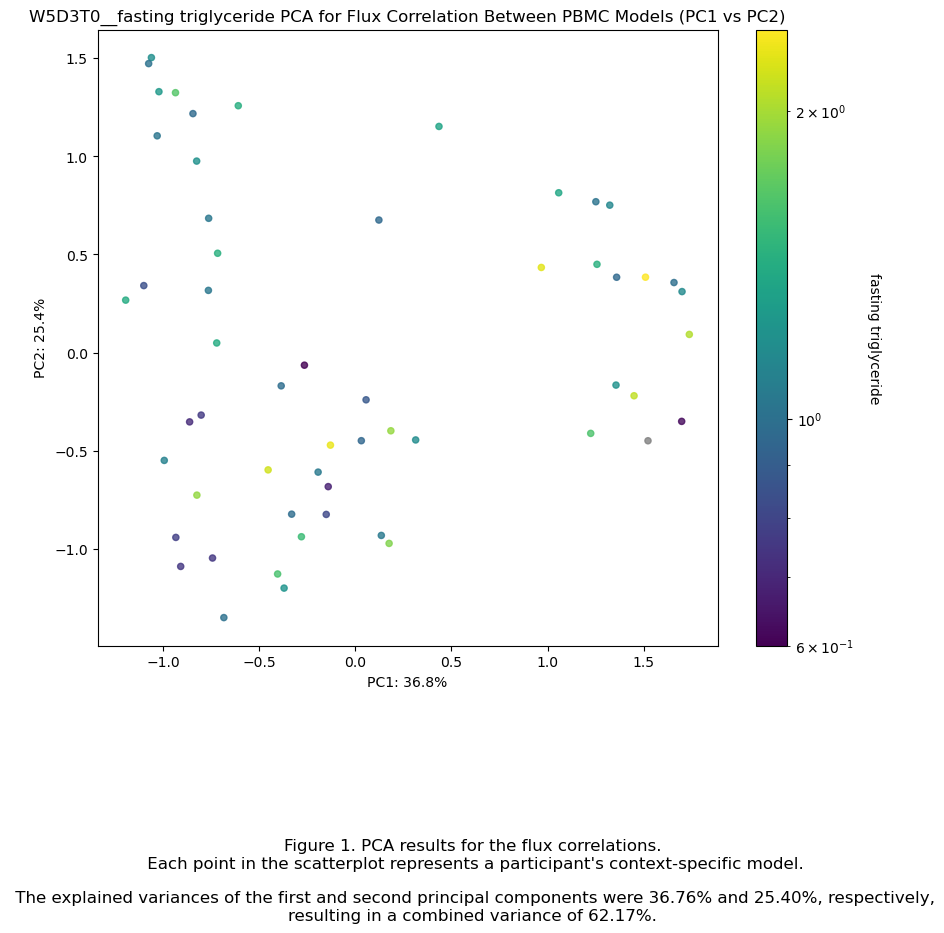

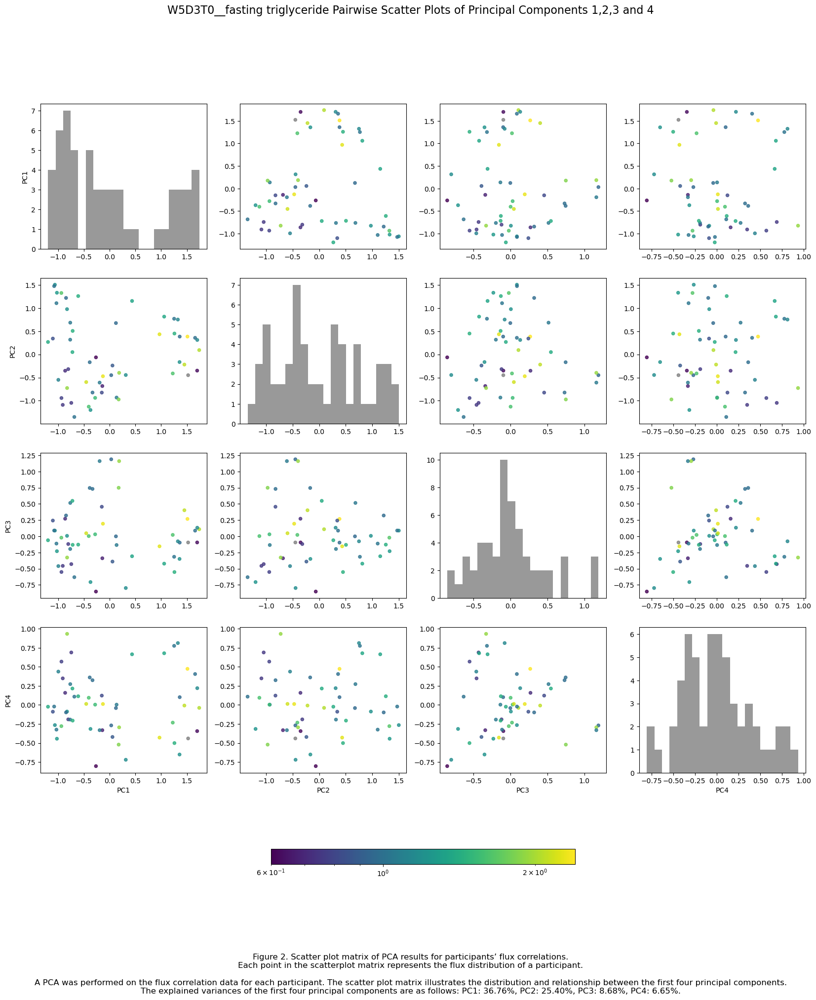

[0.36762544 0.25403733 0.08680735]


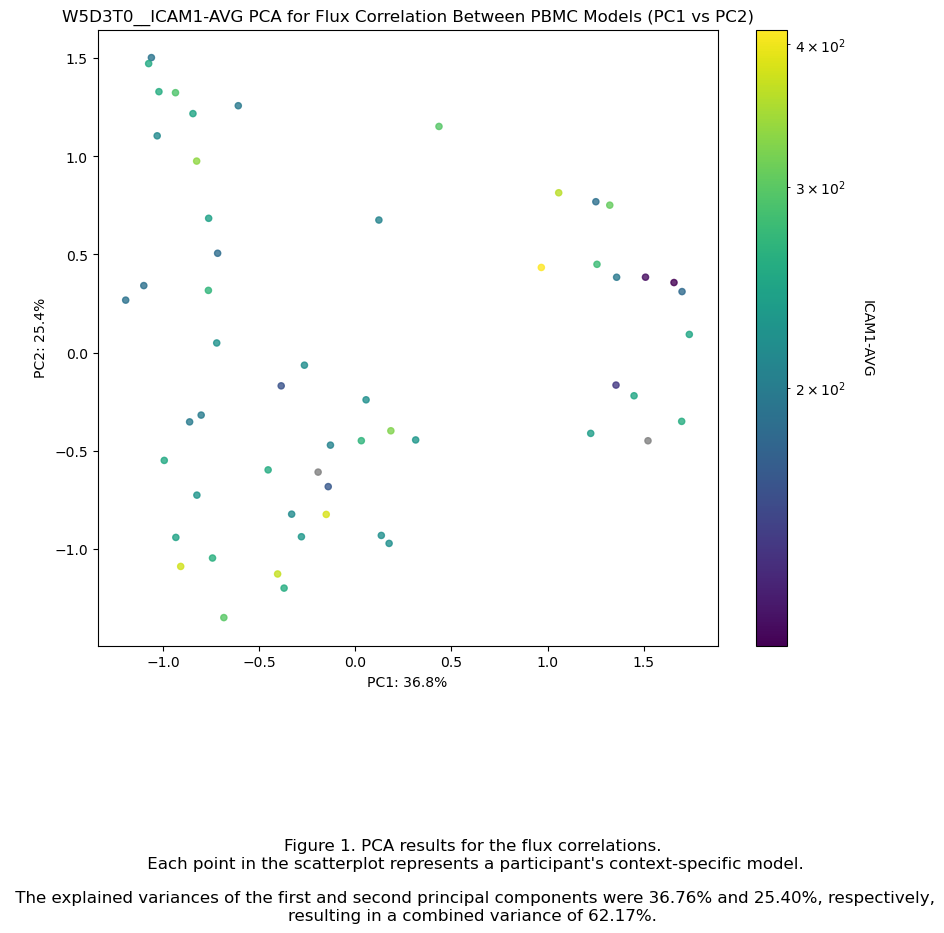

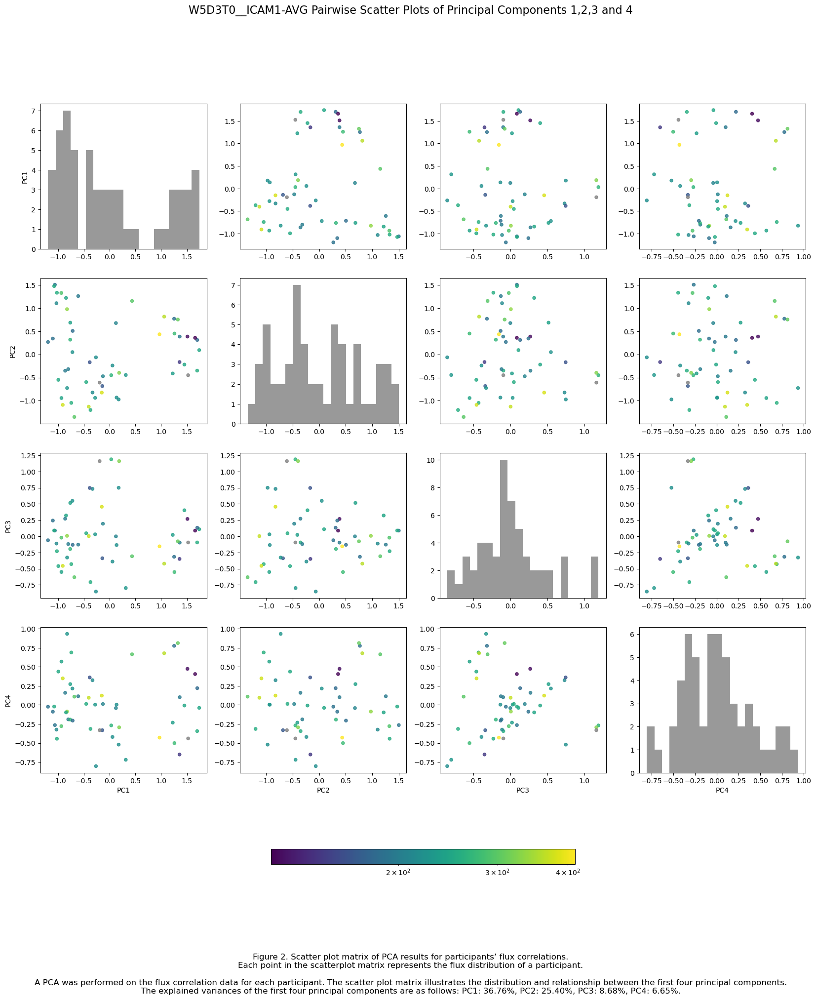

[0.36762544 0.25403733 0.08680735]


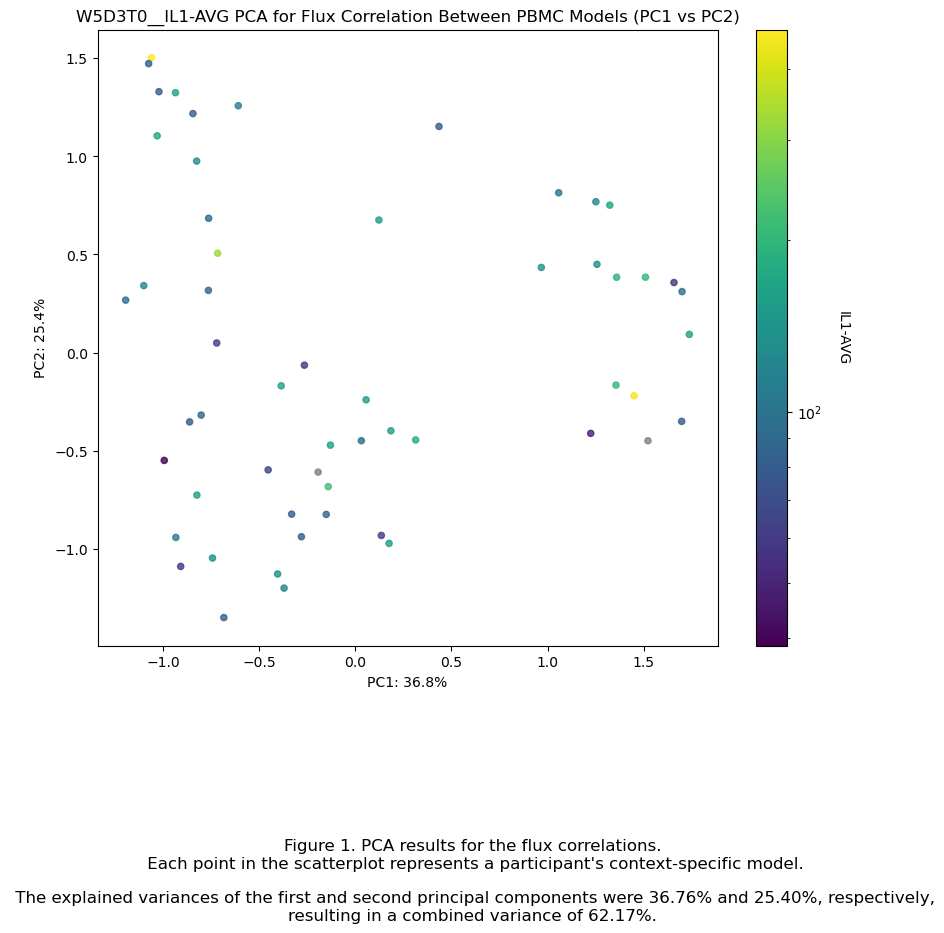

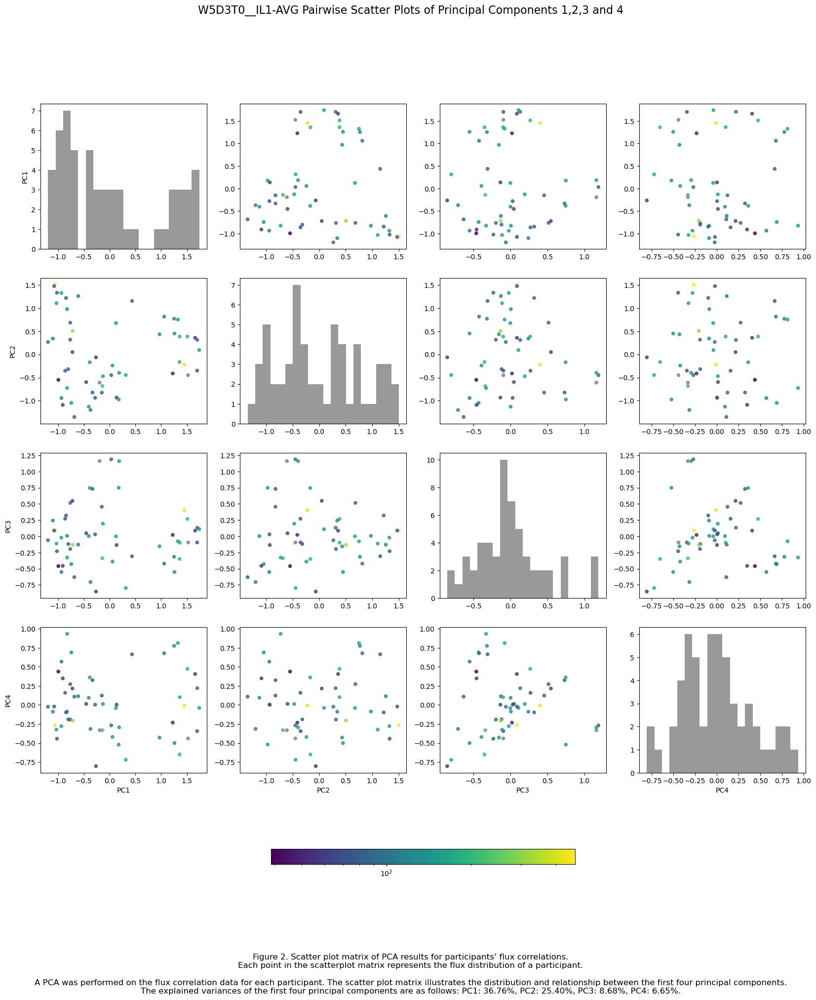

[0.36762544 0.25403733 0.08680735]


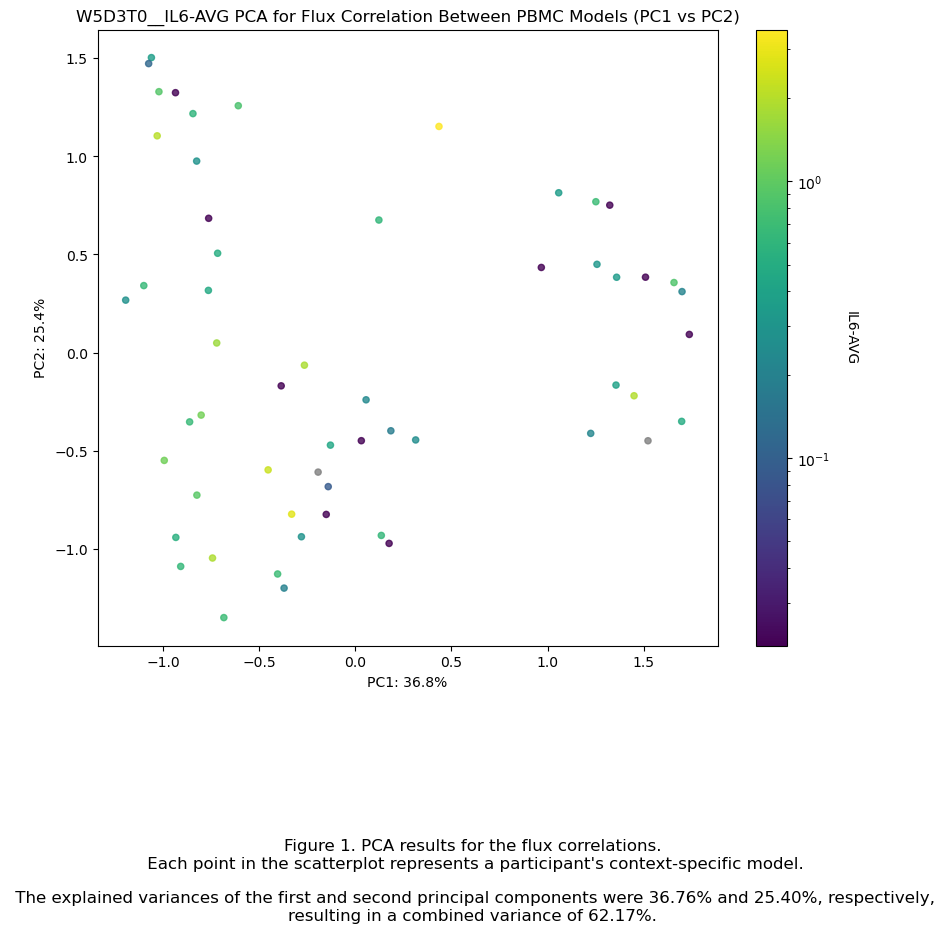

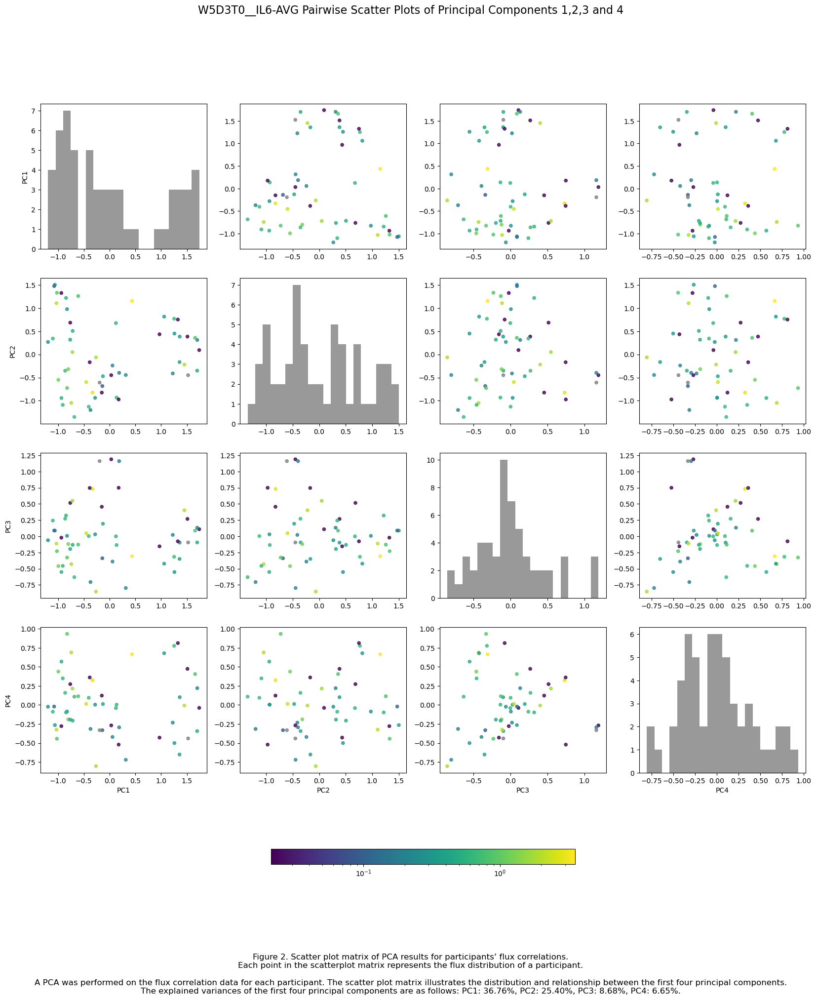

[0.36762544 0.25403733 0.08680735]


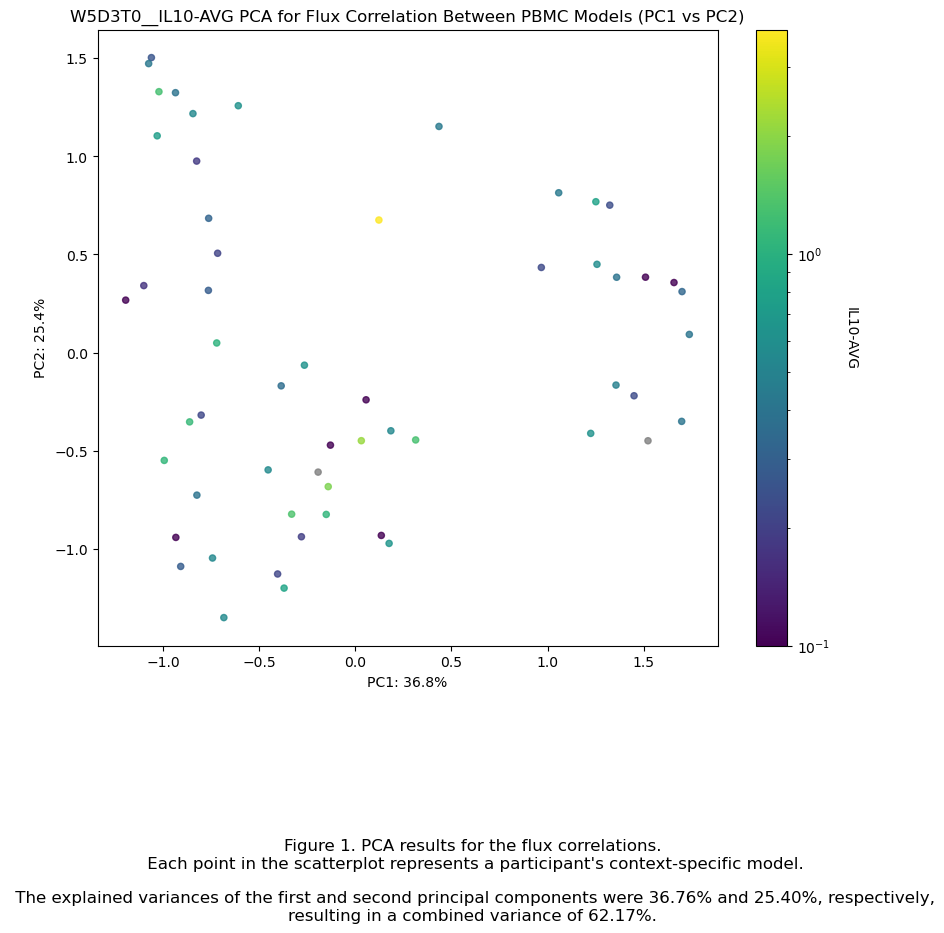

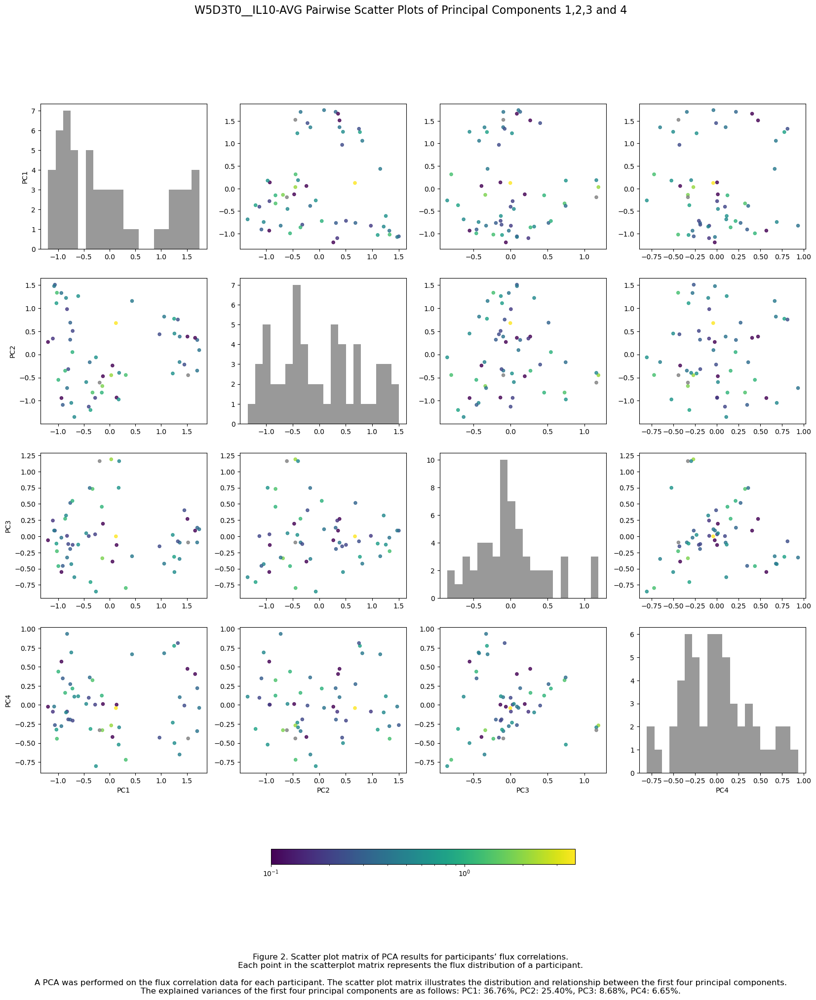

[0.36762544 0.25403733 0.08680735]


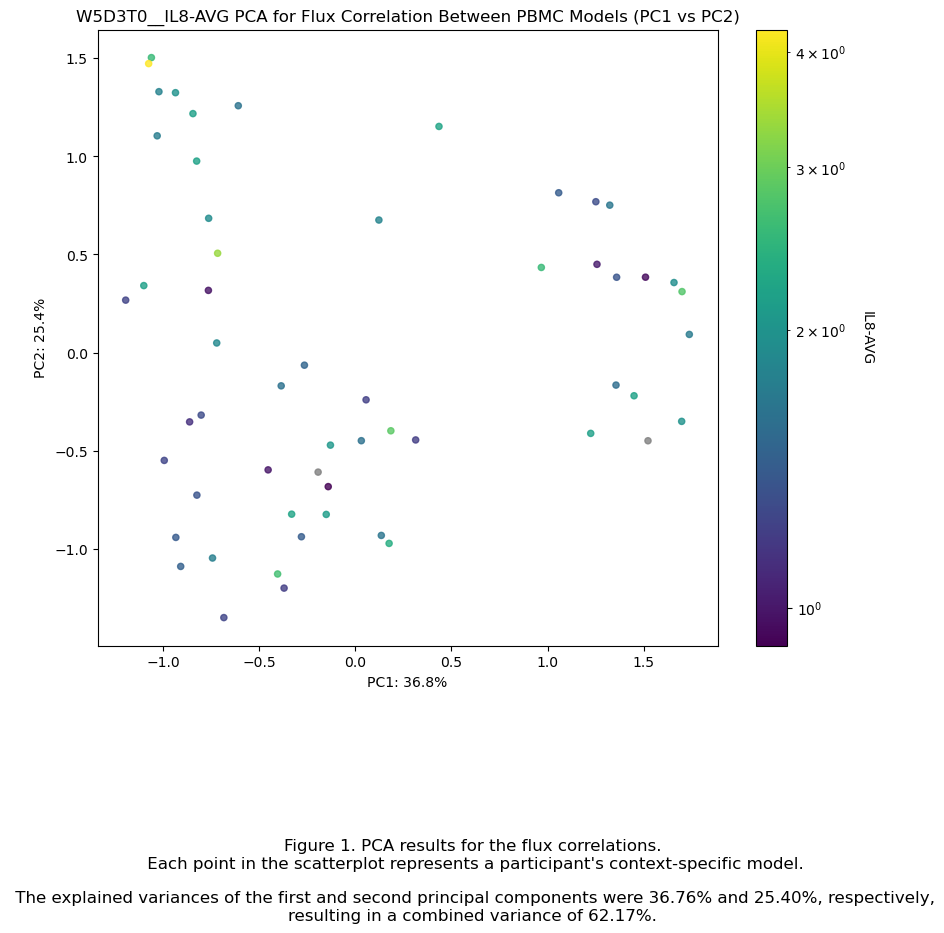

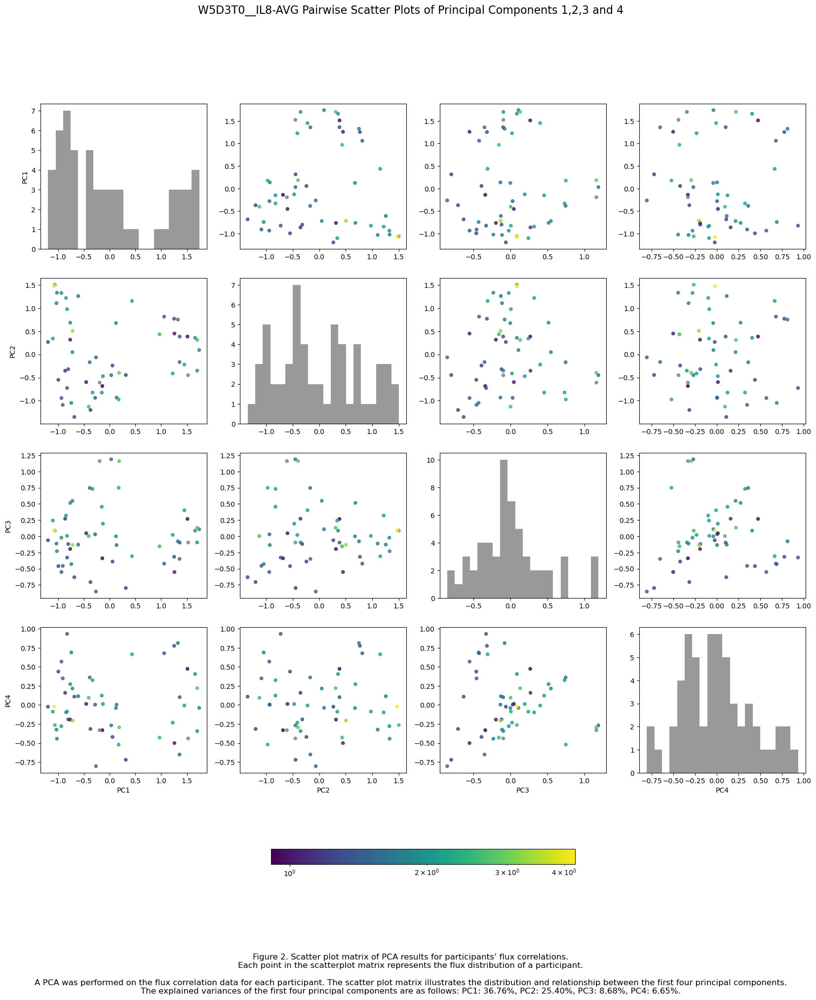

In [8]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Set the file_ID for naming plots and saved figures
file_ID = 'W5D3T0_'
pw_flx1 = pd.read_csv('pw_flx2_1.csv')
columns_to_compare = [ 'fasting triglyceride', 'ICAM1-AVG', 'IL1-AVG', 'IL6-AVG', 'IL10-AVG', 'IL8-AVG']

#Index(['name', 'Age', 'Gender', 'Body weight ', 'Body height ', 'BMI ',
 #      'Start group', 'fasting glucose', '2hr glucose', 'fasting insulin',
  #     'fasting triglyceride', 'HOMA-IR', 'Matsuda', 'IGI', 'CRP-D1',
   #    'E-Selectin-D1', 'IL18-D1', 'IL1b-D1', 'TNF-alpha-D1', 'VCAM-1-D1',
    #   'adiponectin-D1', 'ICAM-D2', 'ICAM1-D3', 'IL1-D2', 'IL1-D3', 'IL10-D2',
     #  'IL10-D3', 'IL6-D2', 'IL6-D3', 'IL8-D2', 'IL8-D3', 'MCP1-D2', 'MCP1-D3',
      # 'IL1-(D2+D3)/2', 'IL6-(D2+D3)/2', 'IL10-(D2+D3)/2', 'IL8-(D2+D3)/2',
       #'MCP1-(D2+D3)/2', 'ICAM1-(D2+D3)/2'],
      #dtype='object')

# Load the entire Excel file
file_path = '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 13/NutriTech_otherdata_AVG.xlsx'
xls = pd.ExcelFile(file_path)

# Print the sheet names to see what sheets are available
print(xls.sheet_names)

# Load a sheet into a DataFrame by sheet name
df_week5_before = pd.read_excel(xls, sheet_name='week5_before_intervention', header=1)

# Extract the participant IDs from NutriTech data (assuming they are in 'name' column)
nutritech_ids = df_week5_before['name'].tolist()
# Extract the participant IDs from pw_flx1.csv column names
pw_flx1_ids = pw_flx1.columns.str.extract(r'(NT\d+)_')[0]

# Initialize lists to capture missing IDs and unmatched columns
missing_ids = []
unmatched_columns = pw_flx1.columns.tolist()

# Map the NutriTech IDs to the corresponding columns in pw_flx1.csv
mapping = {}
for nt_id in nutritech_ids:
    if nt_id in pw_flx1_ids.values:
        matched_column = pw_flx1.columns[pw_flx1_ids[pw_flx1_ids == nt_id].index[0]]
        mapping[nt_id] = matched_column
        unmatched_columns.remove(matched_column)
    else:
        missing_ids.append(nt_id)

# Print results
#print("Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:")
#print(mapping)

if missing_ids:
    print("\nWarning: The following NutriTech IDs were not found in pw_flx1.csv:")
    print(missing_ids)

if unmatched_columns:
    print("\nWarning: The following columns in pw_flx1.csv did not match any NutriTech IDs:")
    #print(unmatched_columns)

for NT_data in columns_to_compare:
    # Extract corresponding labels (numeric values) for the columns in pw_flx1.csv based on the mapping
    pca_labels = []
    for column in pw_flx1.columns:
        matched_id = next((key for key, value in mapping.items() if value == column), None)
        if matched_id:
            label = df_week5_before.loc[df_week5_before['name'] == matched_id, NT_data].values[0]
            pca_labels.append(label)
        else:
            pca_labels.append(np.nan)  # Handle missing data

    # Convert pca_labels to a numpy array for easier handling
    pca_labels = np.array(pca_labels)

    # Filter out non-finite and zero values before setting up LogNorm
    finite_labels = pca_labels[np.isfinite(pca_labels) & (pca_labels > 0)]
    
    # Normalize pca_labels for color mapping with LogNorm
    norm = LogNorm(vmin=finite_labels.min(), vmax=finite_labels.max())

    cmap = plt.cm.viridis  # You can choose any colormap

    # Define a color array: use cmap for valid data and grey for NaN or zero values
    colors = np.array([cmap(norm(val)) if np.isfinite(val) and val > 0 else (0.5, 0.5, 0.5, 1.0) for val in pca_labels])

    # Perform PCA
    pca = PCA(n_components=3)
    pcaData = pca.fit_transform(pw_flx1.T)  # Transpose to make samples as rows
    print(pca.explained_variance_ratio_)

    title_font = {
        'weight': 'medium',
        'size': 12,
    }
    axis_font = {
        'weight': 'normal',
        'size': 10,
    }

    # Plot PCA scatter plot with color gradient
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 8))
    sc = plt.scatter(pcaData[:, 0], pcaData[:, 1], s=20, marker='o', color=colors, alpha=0.8)

    # Add color bar for non-NaN values only
    valid_sc = plt.scatter([], [], c=[], cmap=cmap, norm=norm)
    cbar = plt.colorbar(valid_sc)
    cbar.set_label(f'{NT_data}', rotation=270, labelpad=20)

    plt.title(f'{file_ID}_{NT_data} PCA for Flux Correlation Between PBMC Models (PC1 vs PC2)', title_font)
    plt.xlabel('PC1: {:.1%}'.format(pca.explained_variance_ratio_[0]), axis_font)
    plt.ylabel('PC2: {:.1%}'.format(pca.explained_variance_ratio_[1]), axis_font)
    plt.figtext(0.5, -0.23, (f'Figure 1. PCA results for the flux correlations.\n Each point in the scatterplot represents a participant\'s context-specific model.\n\n The explained variances of the first and second principal components were {pca.explained_variance_ratio_[0]*100:.2f}% and {pca.explained_variance_ratio_[1]*100:.2f}%, respectively, resulting in a combined variance of {((pca.explained_variance_ratio_[0]*100)+(pca.explained_variance_ratio_[1]*100)):.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
    #plt.savefig(f'{file_ID}fig.1_{NT_data}_PCA_for_Flux_Correlation.png', dpi=1000)

    ####################### Create a 4x4 plot matrix of PC1, PC2, PC3, and PC4
    # Perform PCA
    pca = PCA(n_components=4)
    pcaData = pca.fit_transform(pw_flx1.T)
    explained_variance = pca.explained_variance_ratio_

    fig, axs = plt.subplots(4, 4, figsize=(20, 20))

    pc_labels = ['PC1', 'PC2', 'PC3', 'PC4']
    components = [pcaData[:, 0], pcaData[:, 1], pcaData[:, 2], pcaData[:, 3]]

    for i in range(4):
        for j in range(4):
            if i == j:
                axs[i, j].hist(components[i], bins=20, color='gray', alpha=0.8)  # Histogram does not need color mapping
            else:
                sc = axs[i, j].scatter(components[j], components[i], color=colors, s=20, alpha=0.8)
            if i == 3:
                axs[i, j].set_xlabel(pc_labels[j])
            if j == 0:
                axs[i, j].set_ylabel(pc_labels[i])

    # Add a shared color bar
    fig.colorbar(valid_sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.1)

    plt.suptitle(f'{file_ID}_{NT_data} Pairwise Scatter Plots of Principal Components 1,2,3 and 4', fontsize=16, weight='medium')
    plt.figtext(0.5, -0.02, (f'Figure 2. Scatter plot matrix of PCA results for participants’ flux correlations.\n'
                             f'Each point in the scatterplot matrix represents the flux distribution of a participant.\n\n'
                             f'A PCA was performed on the flux correlation data for each participant. The scatter plot matrix illustrates the distribution and relationship between the first four principal components.\n'
                             f'The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)

    plt.savefig(f'{file_ID}fig.2_{NT_data}_Pairwise_Scatter_Plots_of_PC1_to_PC4.png', dpi=1000)
    plt.show()


# W5D3T120, code from docs, FBA = true

['week5_before_intervention', 'week13_after_intervention']
Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:
{'NT001': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D3T120/NT001_W5D3T120', 'NT002': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D3T120/NT002_W5D3T120', 'NT006': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D3T120/NT006_W5D3T120', 'NT008': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork

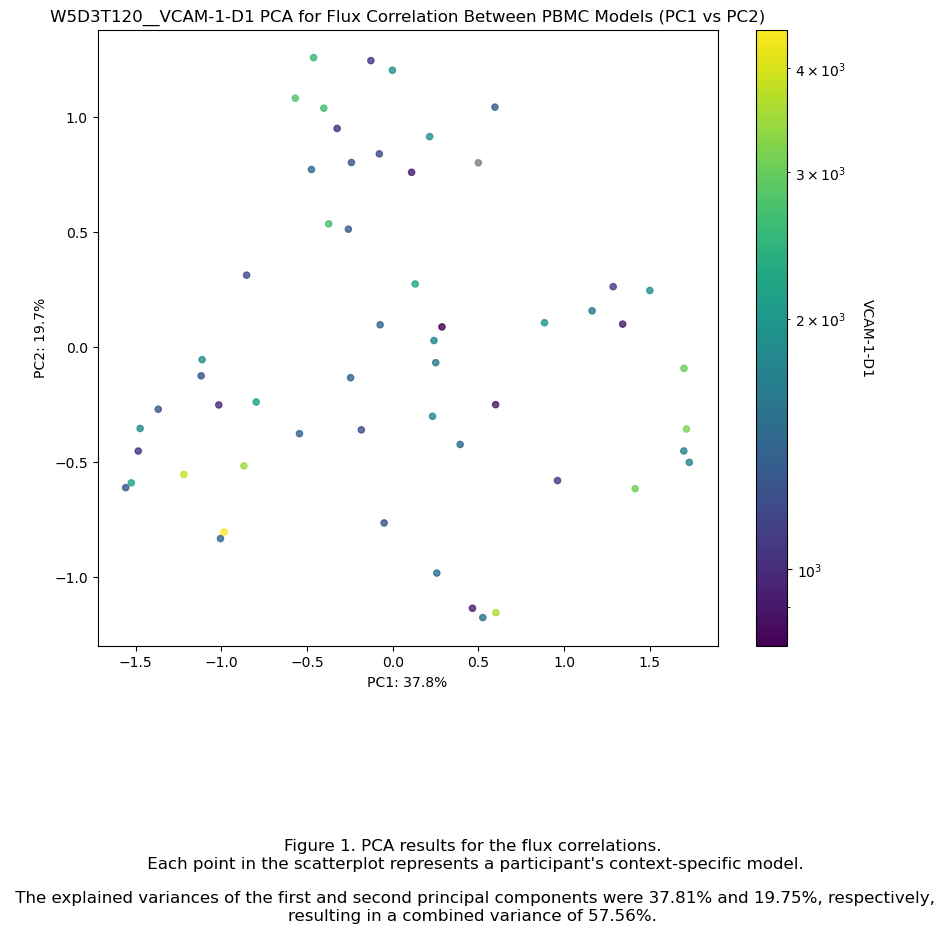

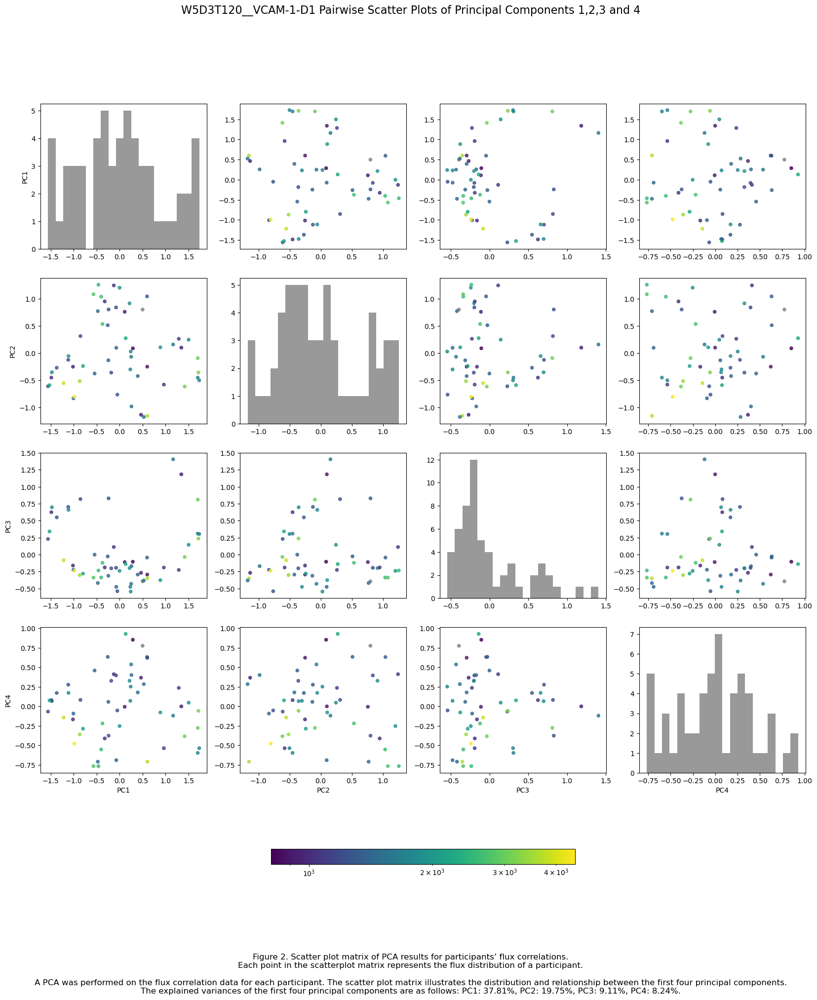

[0.378123   0.19748016 0.09114667]


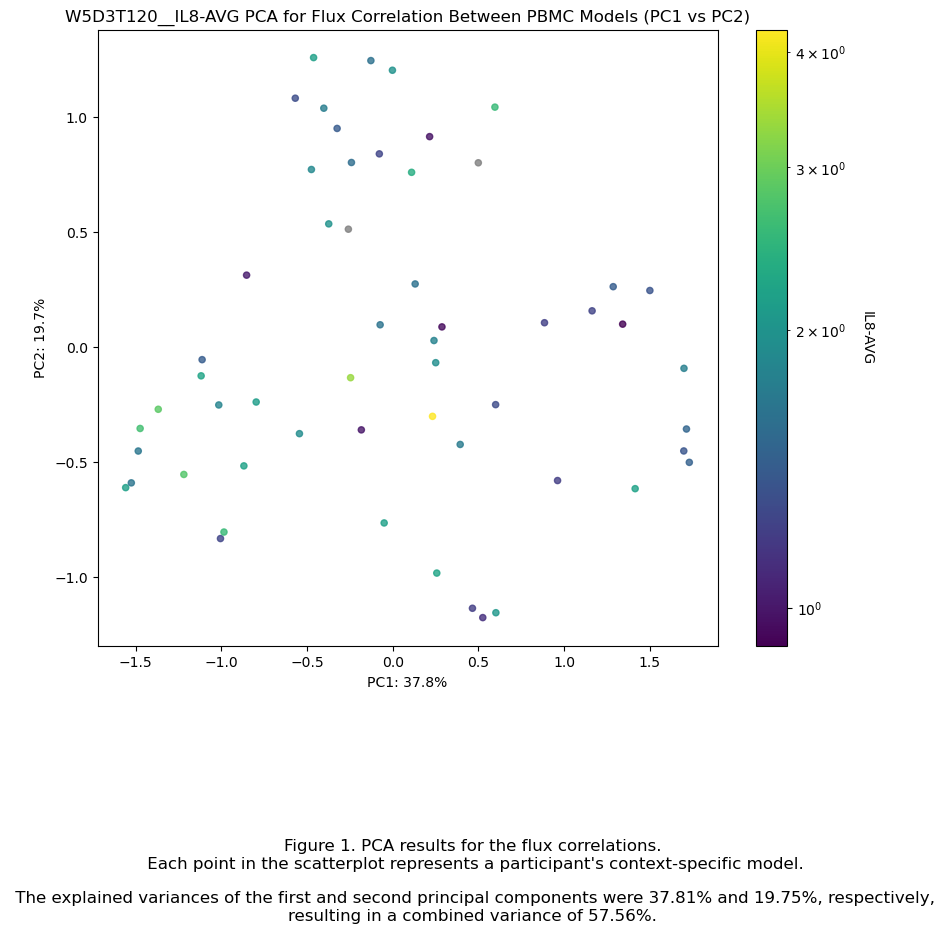

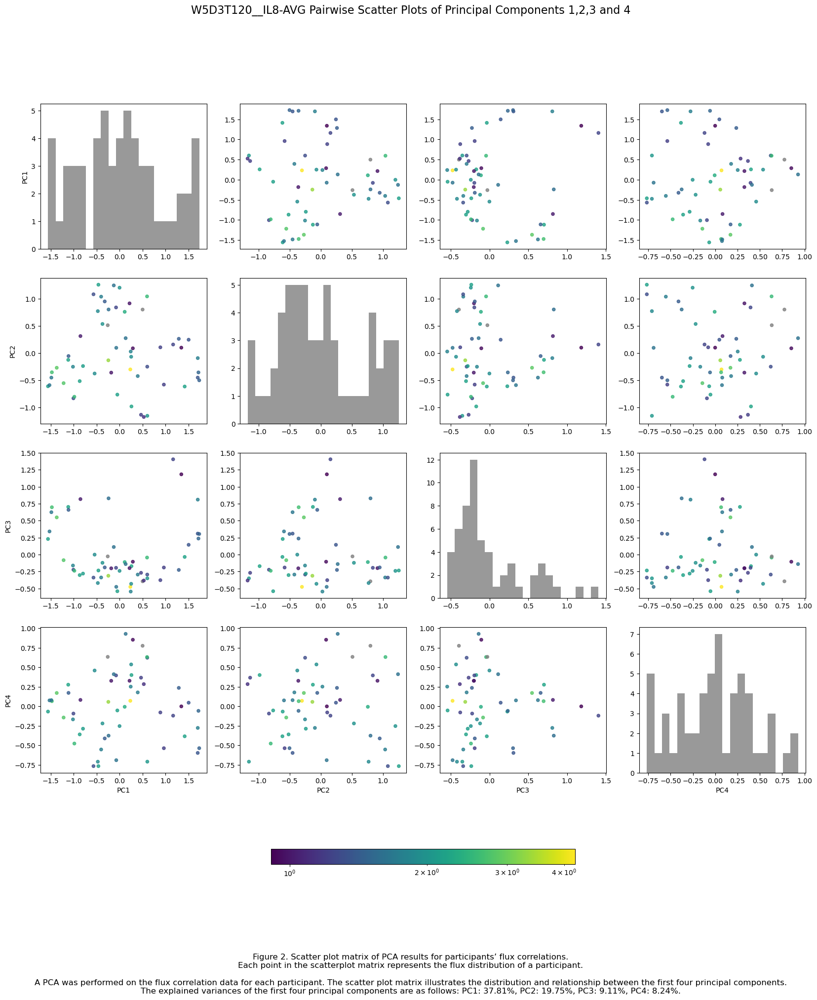

[0.378123   0.19748016 0.09114667]


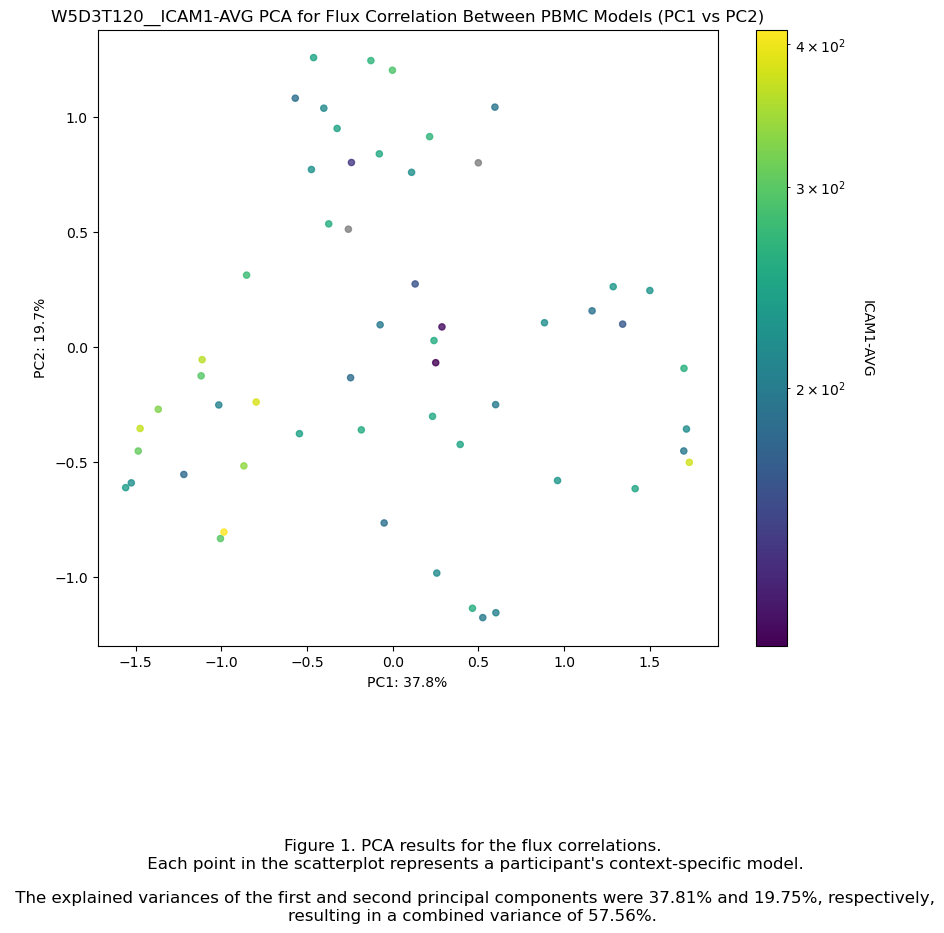

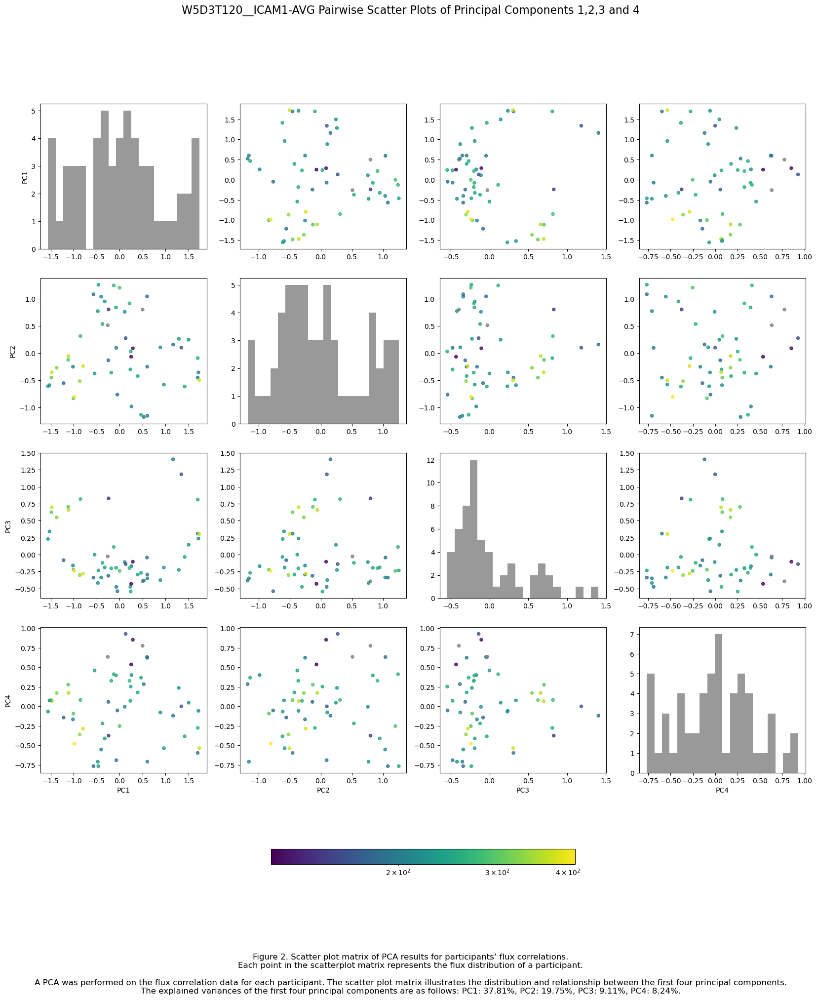

In [9]:
### with grey

import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Set the file_ID for naming plots and saved figures
file_ID = 'W5D3T120_'
pw_flx1 = pd.read_csv('pw_flx2_2.csv')
columns_to_compare = [ 'VCAM-1-D1', 'IL8-AVG', 'ICAM1-AVG']

#Index(['name', 'Age', 'Gender', 'Body weight ', 'Body height ', 'BMI ',
 #      'Start group', 'fasting glucose', '2hr glucose', 'fasting insulin',
  #     'fasting triglyceride', 'HOMA-IR', 'Matsuda', 'IGI', 'CRP-D1',
   #    'E-Selectin-D1', 'IL18-D1', 'IL1b-D1', 'TNF-alpha-D1', 'VCAM-1-D1',
    #   'adiponectin-D1', 'ICAM-D2', 'ICAM1-D3', 'IL1-D2', 'IL1-D3', 'IL10-D2',
     #  'IL10-D3', 'IL6-D2', 'IL6-D3', 'IL8-D2', 'IL8-D3', 'MCP1-D2', 'MCP1-D3',
      # 'IL1-(D2+D3)/2', 'IL6-(D2+D3)/2', 'IL10-(D2+D3)/2', 'IL8-(D2+D3)/2',
       #'MCP1-(D2+D3)/2', 'ICAM1-(D2+D3)/2'],
      #dtype='object')

# Load the entire Excel file
file_path = '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 13/NutriTech_otherdata_AVG.xlsx'
xls = pd.ExcelFile(file_path)

# Print the sheet names to see what sheets are available
print(xls.sheet_names)

# Load a sheet into a DataFrame by sheet name
df_week5_before = pd.read_excel(xls, sheet_name='week5_before_intervention', header=1)

# Extract the participant IDs from NutriTech data (assuming they are in 'name' column)
nutritech_ids = df_week5_before['name'].tolist()
# Extract the participant IDs from pw_flx1.csv column names
pw_flx1_ids = pw_flx1.columns.str.extract(r'(NT\d+)_')[0]

# Initialize lists to capture missing IDs and unmatched columns
missing_ids = []
unmatched_columns = pw_flx1.columns.tolist()

# Map the NutriTech IDs to the corresponding columns in pw_flx1.csv
mapping = {}
for nt_id in nutritech_ids:
    if nt_id in pw_flx1_ids.values:
        matched_column = pw_flx1.columns[pw_flx1_ids[pw_flx1_ids == nt_id].index[0]]
        mapping[nt_id] = matched_column
        unmatched_columns.remove(matched_column)
    else:
        missing_ids.append(nt_id)

# Print results
print("Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:")
print(mapping)

if missing_ids:
    print("\nWarning: The following NutriTech IDs were not found in pw_flx1.csv:")
    print(missing_ids)

if unmatched_columns:
    print("\nWarning: The following columns in pw_flx1.csv did not match any NutriTech IDs:")
    print(unmatched_columns)

for NT_data in columns_to_compare:
    # Extract corresponding labels (numeric values) for the columns in pw_flx1.csv based on the mapping
    pca_labels = []
    for column in pw_flx1.columns:
        matched_id = next((key for key, value in mapping.items() if value == column), None)
        if matched_id:
            label = df_week5_before.loc[df_week5_before['name'] == matched_id, NT_data].values[0]
            pca_labels.append(label)
        else:
            pca_labels.append(np.nan)  # Handle missing data

# Convert pca_labels to a numpy array for easier handling
    pca_labels = np.array(pca_labels)

    # Filter out non-finite and zero values before setting up LogNorm
    finite_labels = pca_labels[np.isfinite(pca_labels) & (pca_labels > 0)]
    
    # Normalize pca_labels for color mapping with LogNorm
    norm = LogNorm(vmin=finite_labels.min(), vmax=finite_labels.max())

    cmap = plt.cm.viridis  # You can choose any colormap

    # Define a color array: use cmap for valid data and grey for NaN or zero values
    colors = np.array([cmap(norm(val)) if np.isfinite(val) and val > 0 else (0.5, 0.5, 0.5, 1.0) for val in pca_labels])

    # Perform PCA
    pca = PCA(n_components=3)
    pcaData = pca.fit_transform(pw_flx1.T)  # Transpose to make samples as rows
    print(pca.explained_variance_ratio_)
    
    title_font = {
        'weight': 'medium',
        'size': 12,
    }
    axis_font = {
        'weight': 'normal',
        'size': 10,
    }

    # Plot PCA scatter plot with color gradient
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 8))
    sc = plt.scatter(pcaData[:, 0], pcaData[:, 1], s=20, marker='o', color=colors, alpha=0.8)

    # Add color bar for non-NaN values only
    valid_sc = plt.scatter([], [], c=[], cmap=cmap, norm=norm)
    cbar = plt.colorbar(valid_sc)
    cbar.set_label(f'{NT_data}', rotation=270, labelpad=20)

    plt.title(f'{file_ID}_{NT_data} PCA for Flux Correlation Between PBMC Models (PC1 vs PC2)', title_font)
    plt.xlabel('PC1: {:.1%}'.format(pca.explained_variance_ratio_[0]), axis_font)
    plt.ylabel('PC2: {:.1%}'.format(pca.explained_variance_ratio_[1]), axis_font)
    plt.figtext(0.5, -0.23, (f'Figure 1. PCA results for the flux correlations.\n Each point in the scatterplot represents a participant\'s context-specific model.\n\n The explained variances of the first and second principal components were {pca.explained_variance_ratio_[0]*100:.2f}% and {pca.explained_variance_ratio_[1]*100:.2f}%, respectively, resulting in a combined variance of {((pca.explained_variance_ratio_[0]*100)+(pca.explained_variance_ratio_[1]*100)):.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
    #plt.savefig(f'{file_ID}fig.1_{NT_data}_PCA_for_Flux_Correlation.png', dpi=1000)

    ####################### Create a 4x4 plot matrix of PC1, PC2, PC3, and PC4
    # Perform PCA
    pca = PCA(n_components=4)
    pcaData = pca.fit_transform(pw_flx1.T)
    explained_variance = pca.explained_variance_ratio_

    fig, axs = plt.subplots(4, 4, figsize=(20, 20))

    pc_labels = ['PC1', 'PC2', 'PC3', 'PC4']
    components = [pcaData[:, 0], pcaData[:, 1], pcaData[:, 2], pcaData[:, 3]]

    for i in range(4):
        for j in range(4):
            if i == j:
                axs[i, j].hist(components[i], bins=20, color='gray', alpha=0.8)  # Histogram does not need color mapping
            else:
                sc = axs[i, j].scatter(components[j], components[i], color=colors, s=20, alpha=0.8)
            if i == 3:
                axs[i, j].set_xlabel(pc_labels[j])
            if j == 0:
                axs[i, j].set_ylabel(pc_labels[i])

    # Add a shared color bar
    fig.colorbar(valid_sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.1)

    plt.suptitle(f'{file_ID}_{NT_data} Pairwise Scatter Plots of Principal Components 1,2,3 and 4', fontsize=16, weight='medium')
    plt.figtext(0.5, -0.02, (f'Figure 2. Scatter plot matrix of PCA results for participants’ flux correlations.\n'
                             f'Each point in the scatterplot matrix represents the flux distribution of a participant.\n\n'
                             f'A PCA was performed on the flux correlation data for each participant. The scatter plot matrix illustrates the distribution and relationship between the first four principal components.\n'
                             f'The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)

    plt.savefig(f'{file_ID}fig.2_{NT_data}_Pairwise_Scatter_Plots_of_PC1_to_PC4.png', dpi=1000)
    plt.show()


# W5D3T240, code from docs, FBA = true

['week5_before_intervention', 'week13_after_intervention']
Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:
{'NT001': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D3T240/NT001_W5D3T240', 'NT002': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D3T240/NT002_W5D3T240', 'NT006': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 11, Get FBA working or Sampling,/W5D3T240/NT006_W5D3T240', 'NT008': '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork

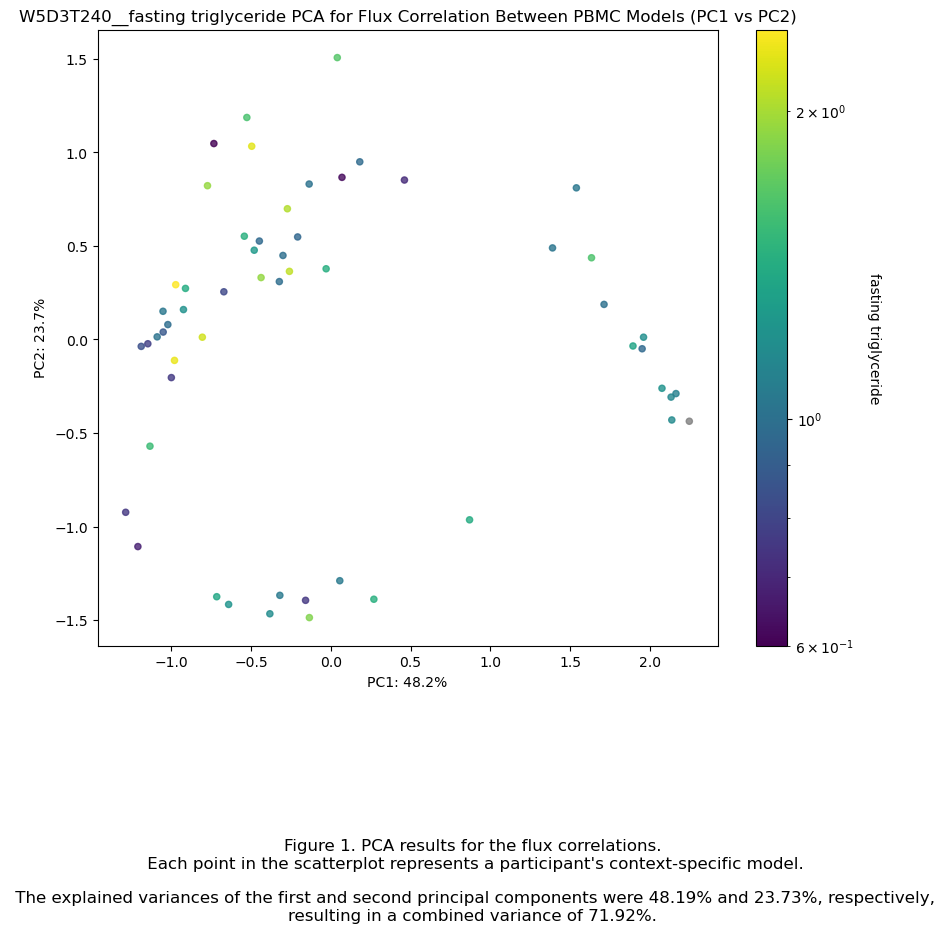

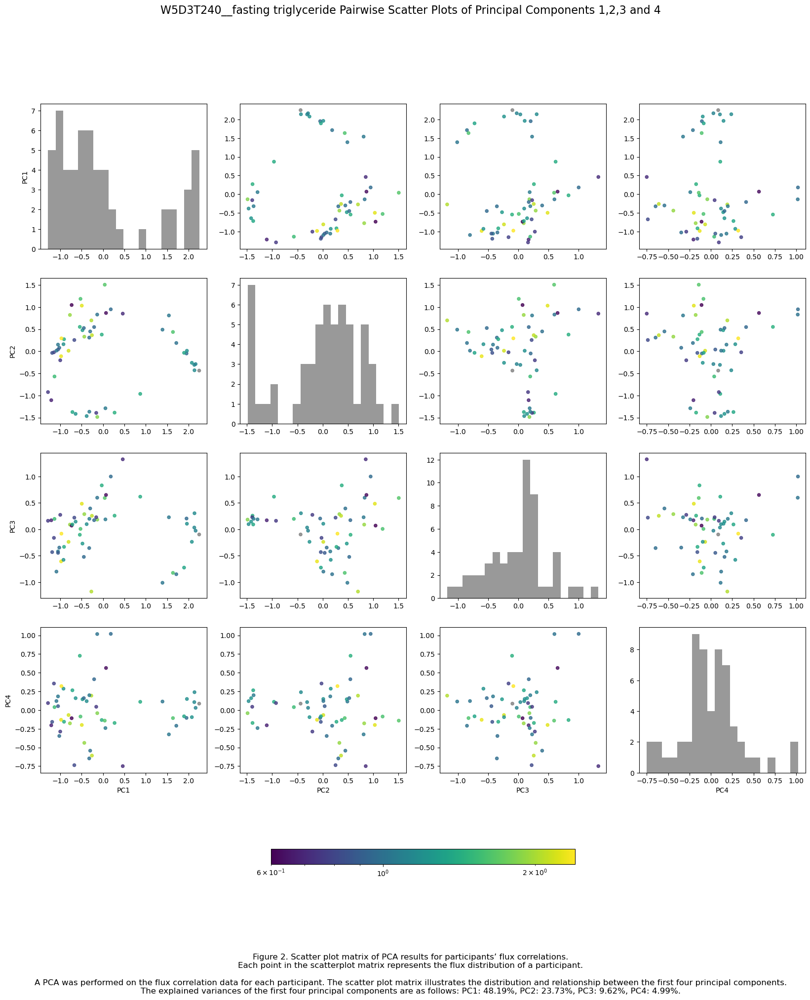

[0.48191545 0.23733323 0.09619983]


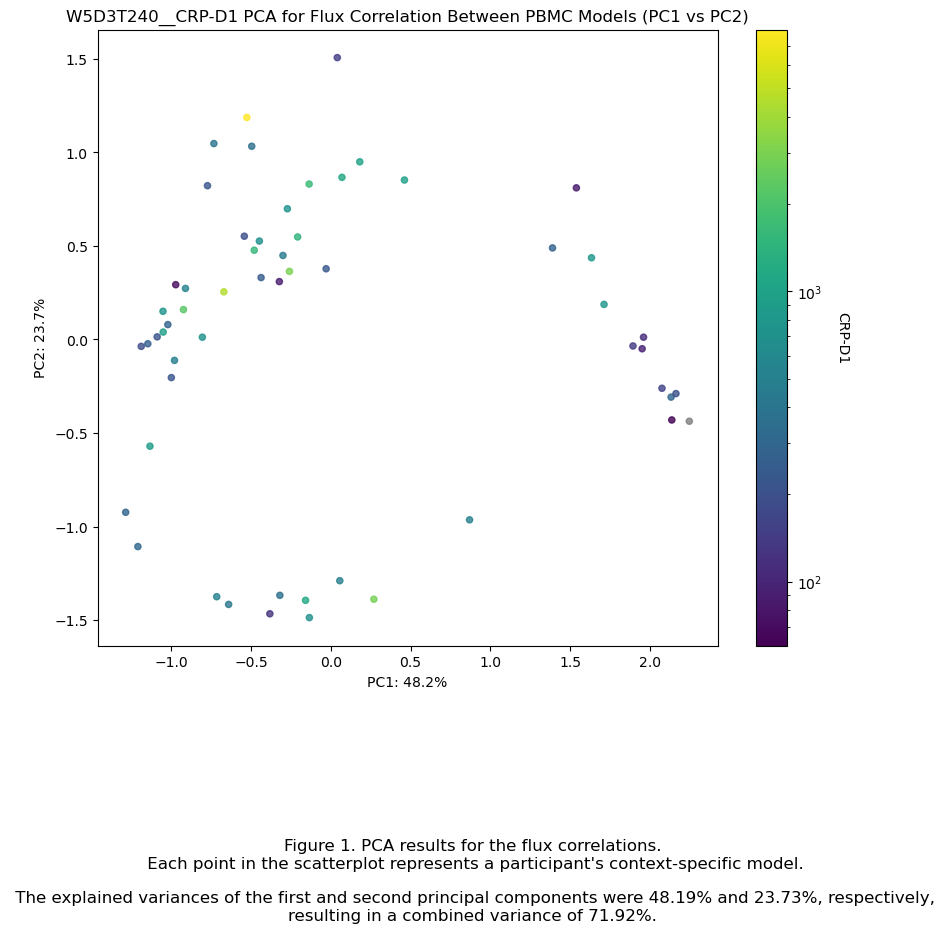

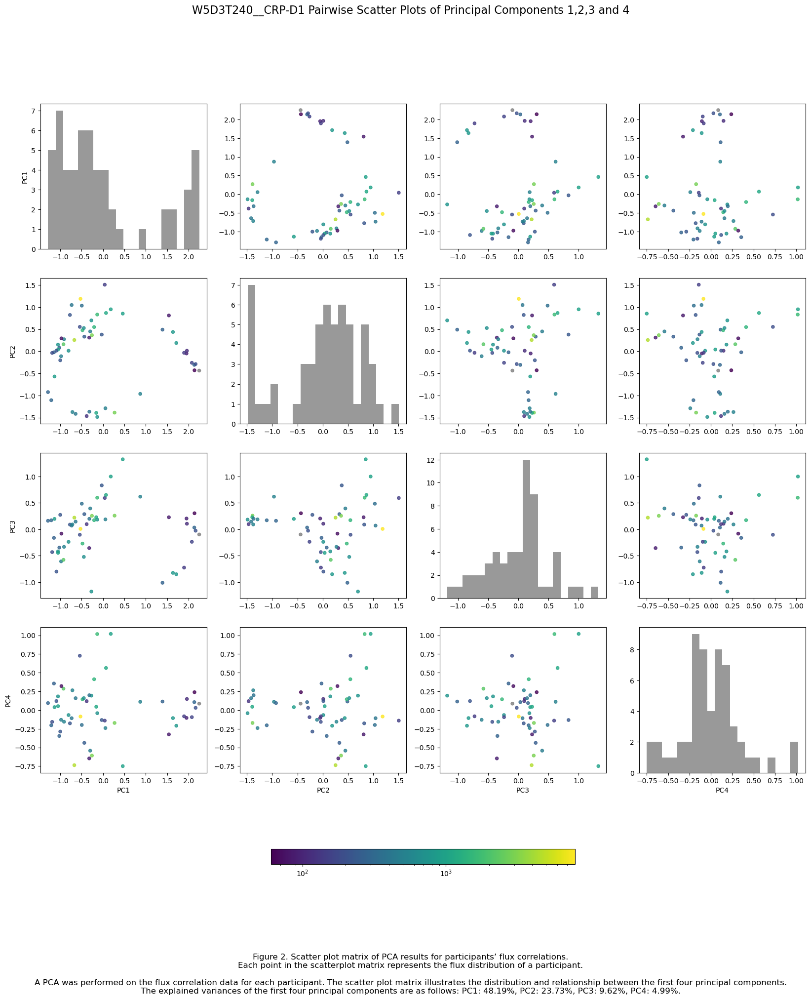

[0.48191545 0.23733323 0.09619983]


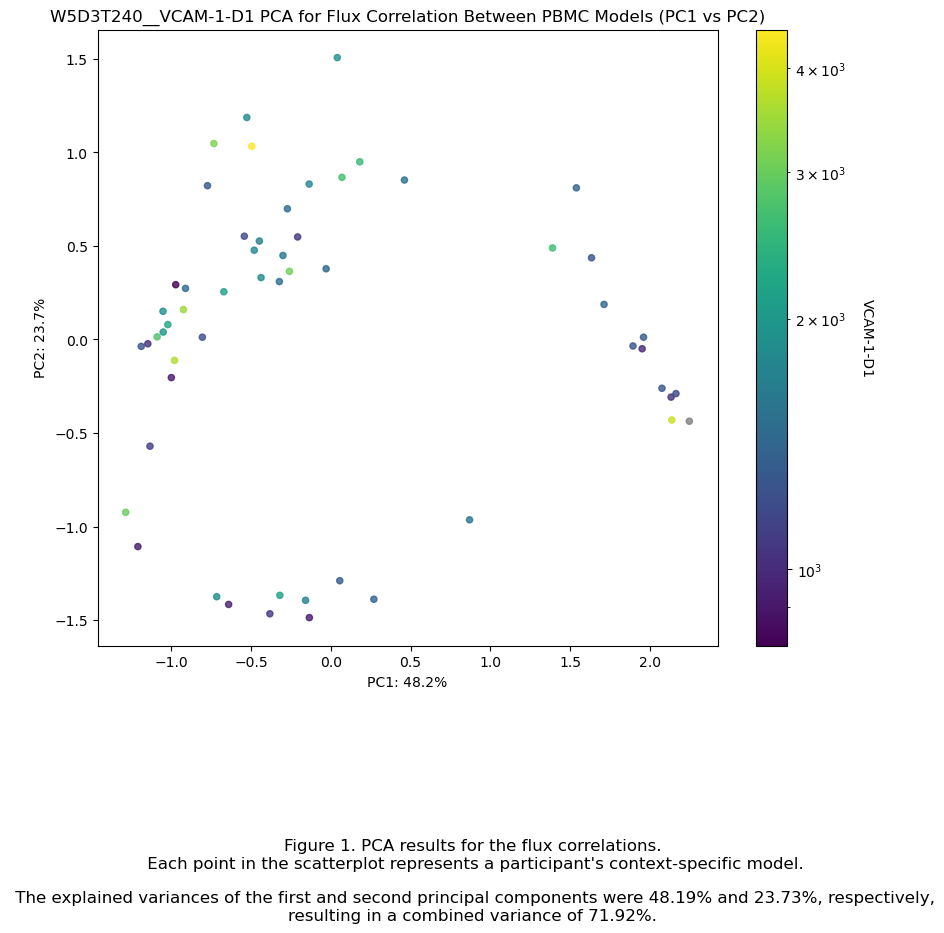

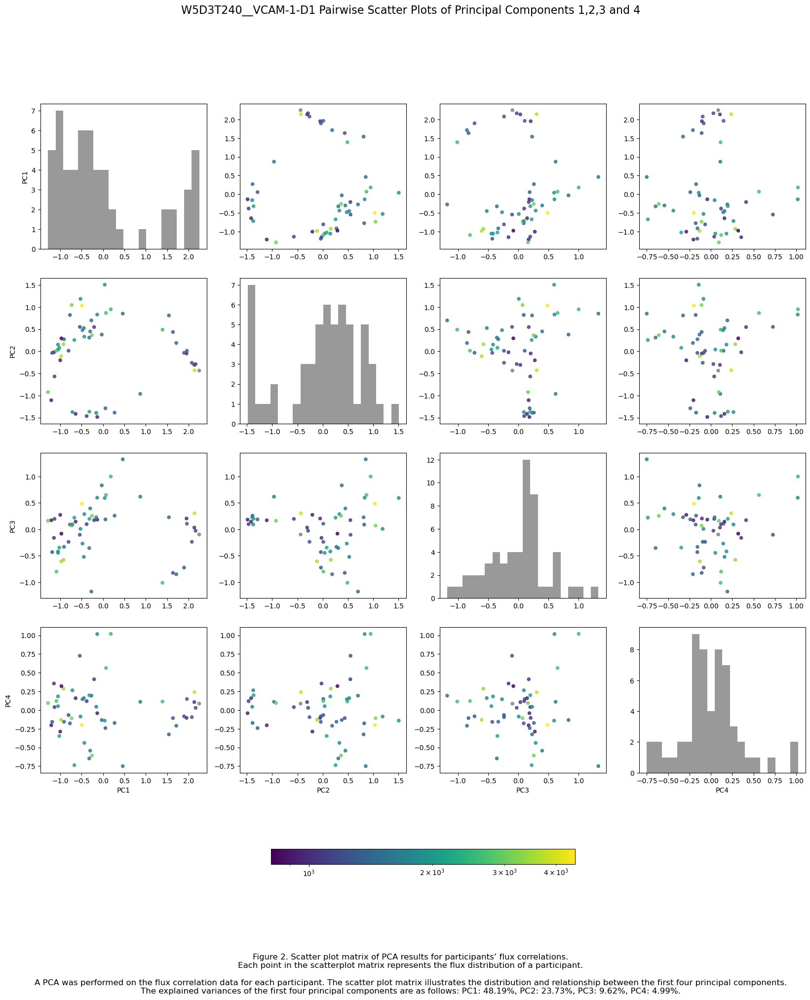

[0.48191545 0.23733323 0.09619983]


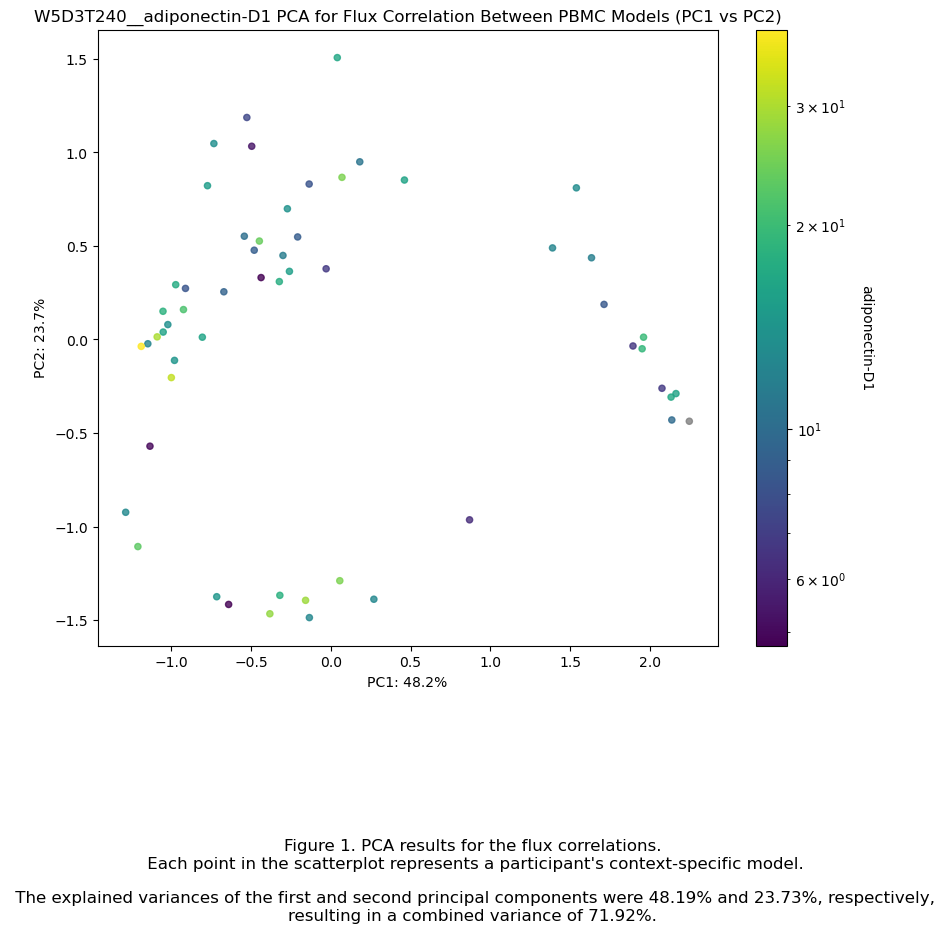

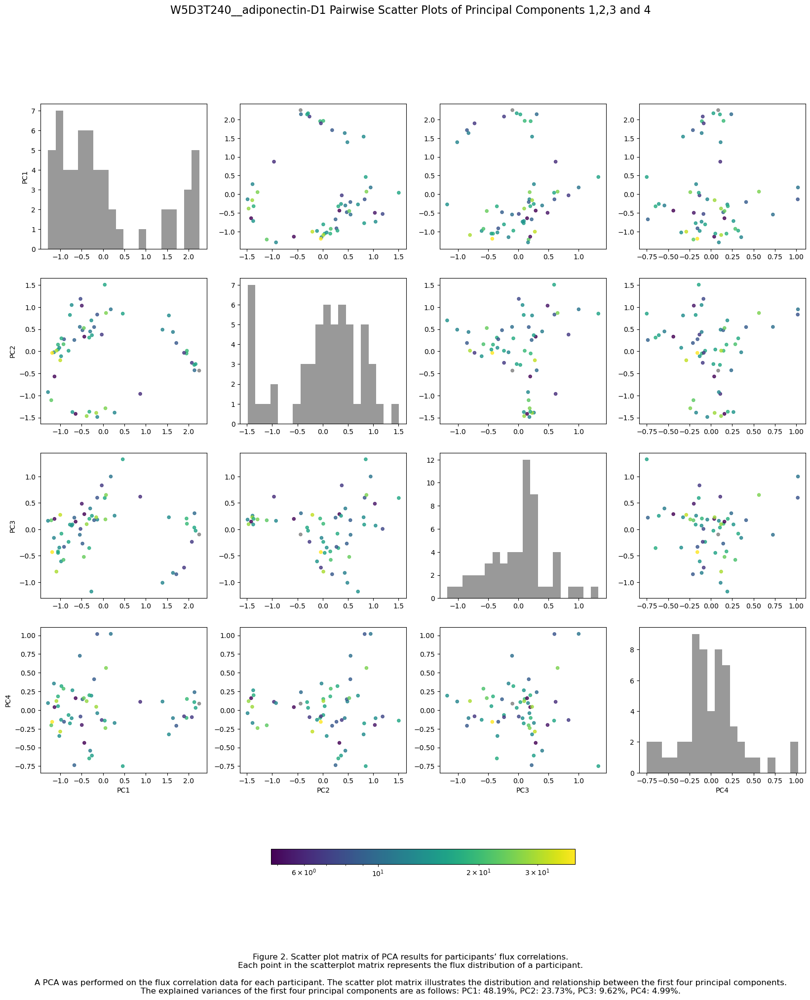

[0.48191545 0.23733323 0.09619983]


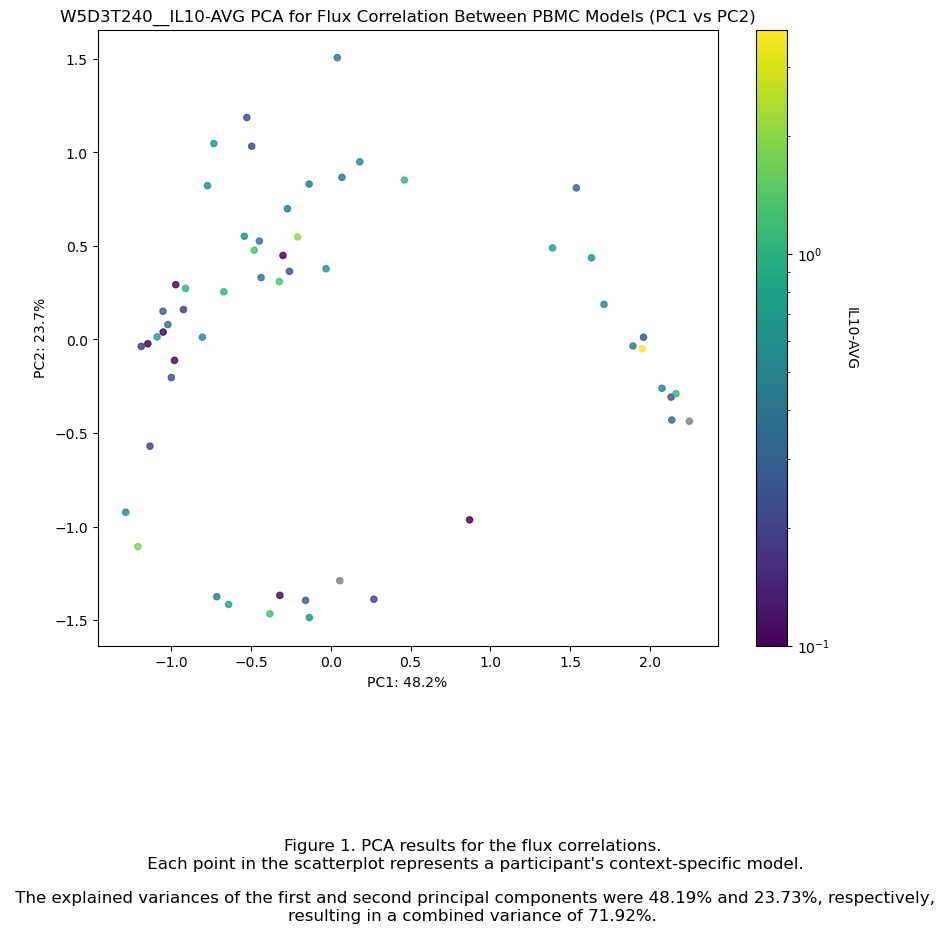

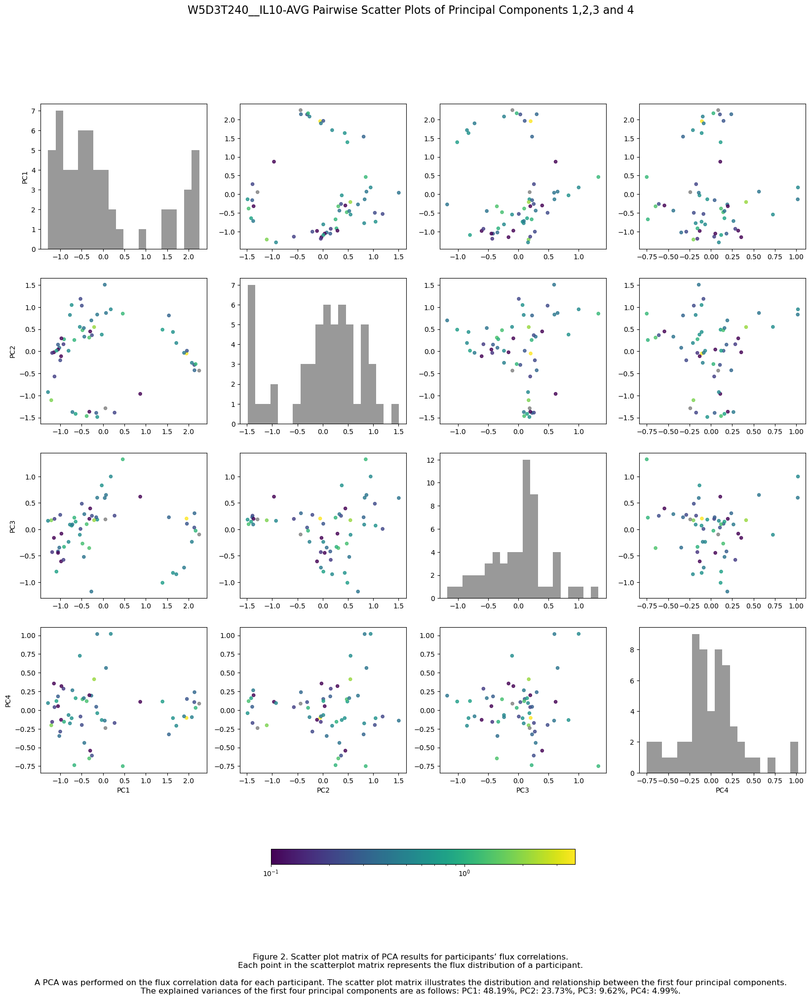

[0.48191545 0.23733323 0.09619983]


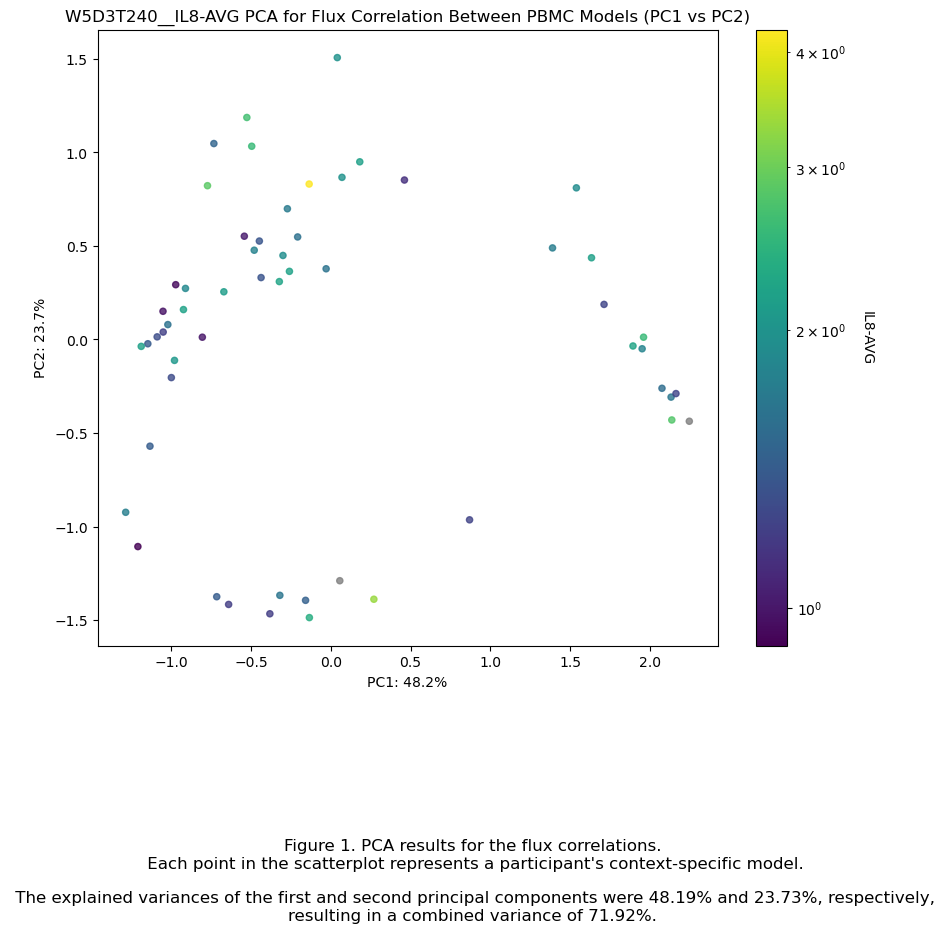

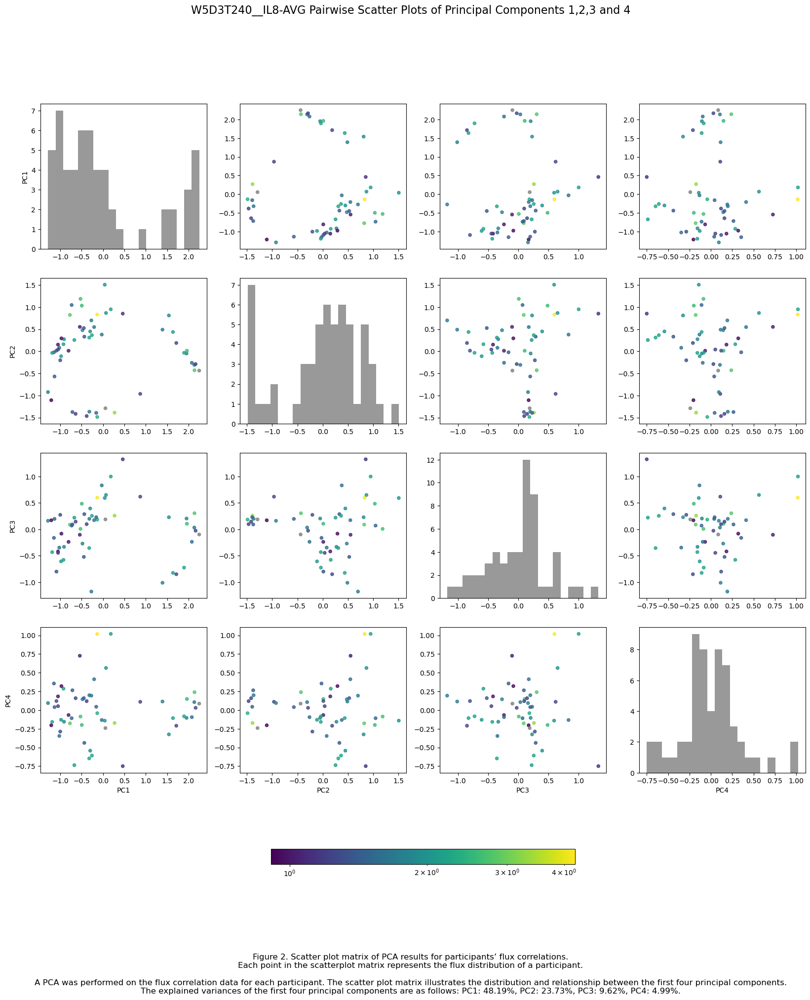

[0.48191545 0.23733323 0.09619983]


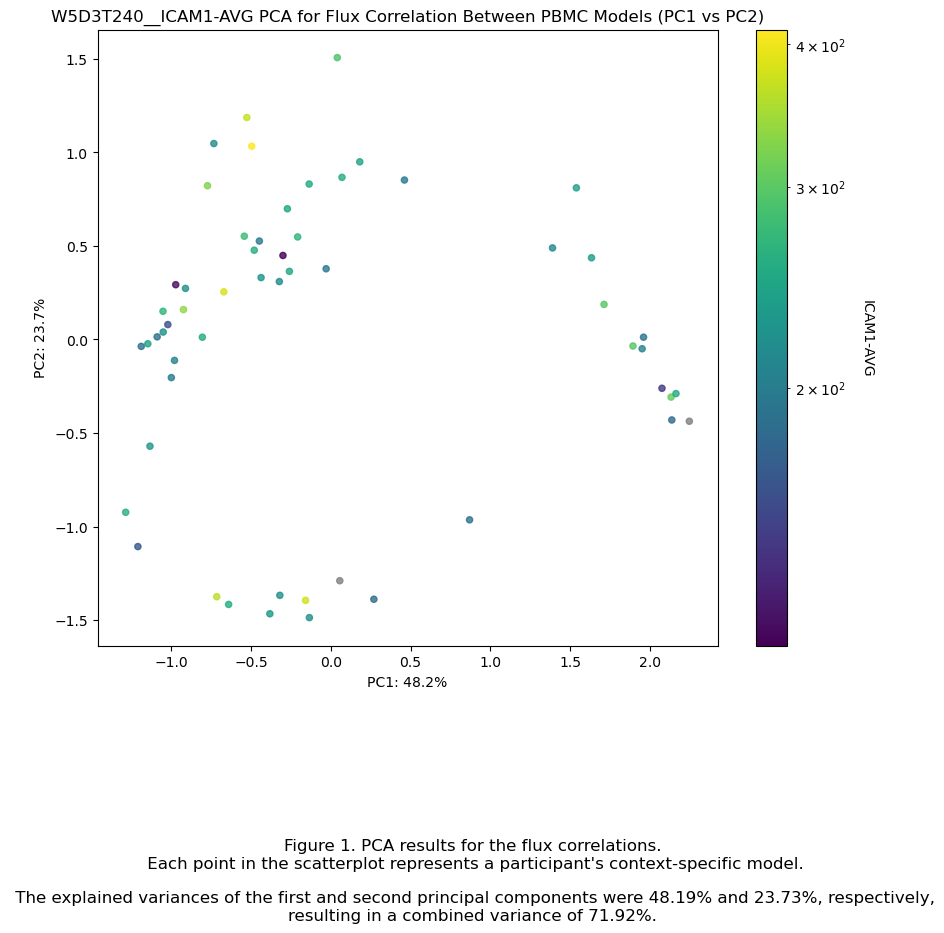

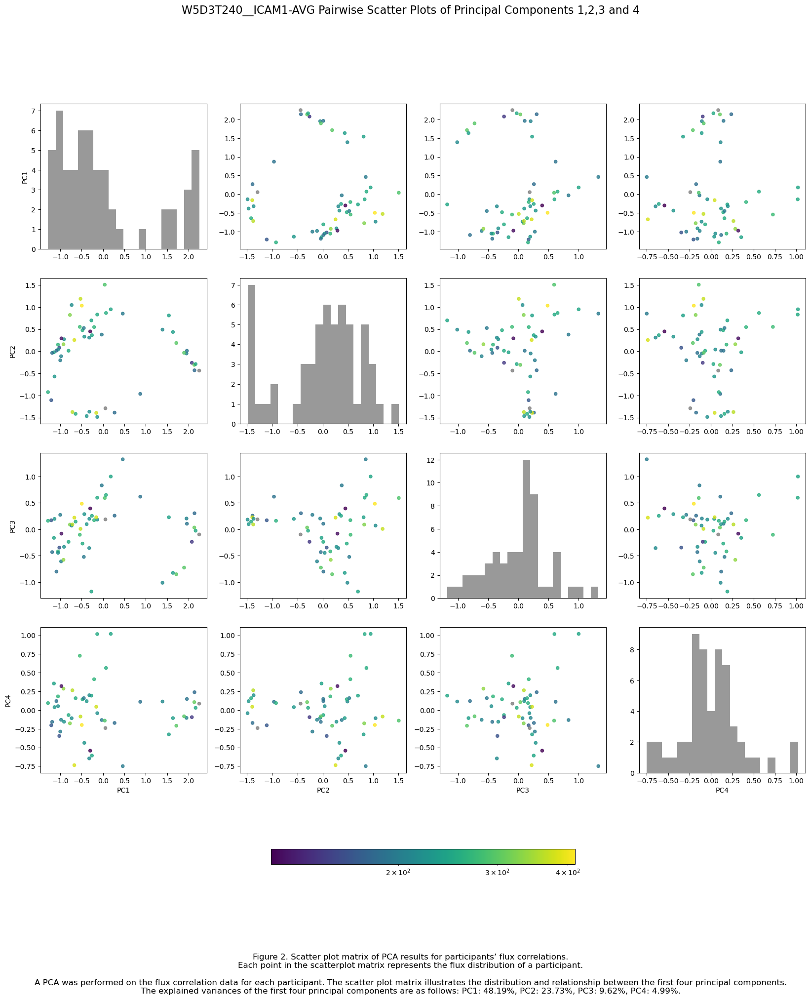

In [10]:
### with grey

import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Set the file_ID for naming plots and saved figures
file_ID = 'W5D3T240_'
pw_flx1 = pd.read_csv('pw_flx2_3.csv')
columns_to_compare = [ 'fasting triglyceride', 'CRP-D1',  'VCAM-1-D1','adiponectin-D1','IL10-AVG', 'IL8-AVG','ICAM1-AVG']

#Index(['name', 'Age', 'Gender', 'Body weight ', 'Body height ', 'BMI ',
 #      'Start group', 'fasting glucose', '2hr glucose', 'fasting insulin',
  #     'fasting triglyceride', 'HOMA-IR', 'Matsuda', 'IGI', 'CRP-D1',
   #    'E-Selectin-D1', 'IL18-D1', 'IL1b-D1', 'TNF-alpha-D1', 'VCAM-1-D1',
    #   'adiponectin-D1', 'ICAM-D2', 'ICAM1-D3', 'IL1-D2', 'IL1-D3', 'IL10-D2',
     #  'IL10-D3', 'IL6-D2', 'IL6-D3', 'IL8-D2', 'IL8-D3', 'MCP1-D2', 'MCP1-D3',
      # 'IL1-(D2+D3)/2', 'IL6-(D2+D3)/2', 'IL10-(D2+D3)/2', 'IL8-(D2+D3)/2',
       #'MCP1-(D2+D3)/2', 'ICAM1-(D2+D3)/2'],
      #dtype='object')

# Load the entire Excel file
file_path = '/Users/douglas/Library/CloudStorage/OneDrive-UniversityCollegeCork/Msc Bioinformatics and Computational Biology/MB6303 Dissertion in Bioinformatics & Computational Biology/Practical Work/python_/week 13/NutriTech_otherdata_AVG.xlsx'
xls = pd.ExcelFile(file_path)

# Print the sheet names to see what sheets are available
print(xls.sheet_names)

# Load a sheet into a DataFrame by sheet name
df_week5_before = pd.read_excel(xls, sheet_name='week5_before_intervention', header=1)

# Extract the participant IDs from NutriTech data (assuming they are in 'name' column)
nutritech_ids = df_week5_before['name'].tolist()
# Extract the participant IDs from pw_flx1.csv column names
pw_flx1_ids = pw_flx1.columns.str.extract(r'(NT\d+)_')[0]

# Initialize lists to capture missing IDs and unmatched columns
missing_ids = []
unmatched_columns = pw_flx1.columns.tolist()

# Map the NutriTech IDs to the corresponding columns in pw_flx1.csv
mapping = {}
for nt_id in nutritech_ids:
    if nt_id in pw_flx1_ids.values:
        matched_column = pw_flx1.columns[pw_flx1_ids[pw_flx1_ids == nt_id].index[0]]
        mapping[nt_id] = matched_column
        unmatched_columns.remove(matched_column)
    else:
        missing_ids.append(nt_id)

# Print results
print("Correct Mapping of NutriTech IDs to pw_flx1.csv Columns:")
print(mapping)

if missing_ids:
    print("\nWarning: The following NutriTech IDs were not found in pw_flx1.csv:")
    print(missing_ids)

if unmatched_columns:
    print("\nWarning: The following columns in pw_flx1.csv did not match any NutriTech IDs:")
    print(unmatched_columns)

for NT_data in columns_to_compare:
    # Extract corresponding labels (numeric values) for the columns in pw_flx1.csv based on the mapping
    pca_labels = []
    for column in pw_flx1.columns:
        matched_id = next((key for key, value in mapping.items() if value == column), None)
        if matched_id:
            label = df_week5_before.loc[df_week5_before['name'] == matched_id, NT_data].values[0]
            pca_labels.append(label)
        else:
            pca_labels.append(np.nan)  # Handle missing data

    # Convert pca_labels to a numpy array for easier handling
    pca_labels = np.array(pca_labels)

    # Filter out non-finite and zero values before setting up LogNorm
    finite_labels = pca_labels[np.isfinite(pca_labels) & (pca_labels > 0)]
    
    # Normalize pca_labels for color mapping with LogNorm
    norm = LogNorm(vmin=finite_labels.min(), vmax=finite_labels.max())

    cmap = plt.cm.viridis  # You can choose any colormap

    # Define a color array: use cmap for valid data and grey for NaN or zero values
    colors = np.array([cmap(norm(val)) if np.isfinite(val) and val > 0 else (0.5, 0.5, 0.5, 1.0) for val in pca_labels])

    # Perform PCA
    pca = PCA(n_components=3)
    pcaData = pca.fit_transform(pw_flx1.T)  # Transpose to make samples as rows
    print(pca.explained_variance_ratio_)

    
    title_font = {
        'weight': 'medium',
        'size': 12,
    }
    axis_font = {
        'weight': 'normal',
        'size': 10,
    }

    # Plot PCA scatter plot with color gradient
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 8))
    sc = plt.scatter(pcaData[:, 0], pcaData[:, 1], s=20, marker='o', color=colors, alpha=0.8)

    # Add color bar for non-NaN values only
    valid_sc = plt.scatter([], [], c=[], cmap=cmap, norm=norm)
    cbar = plt.colorbar(valid_sc)
    cbar.set_label(f'{NT_data}', rotation=270, labelpad=20)

    plt.title(f'{file_ID}_{NT_data} PCA for Flux Correlation Between PBMC Models (PC1 vs PC2)', title_font)
    plt.xlabel('PC1: {:.1%}'.format(pca.explained_variance_ratio_[0]), axis_font)
    plt.ylabel('PC2: {:.1%}'.format(pca.explained_variance_ratio_[1]), axis_font)
    plt.figtext(0.5, -0.23, (f'Figure 1. PCA results for the flux correlations.\n Each point in the scatterplot represents a participant\'s context-specific model.\n\n The explained variances of the first and second principal components were {pca.explained_variance_ratio_[0]*100:.2f}% and {pca.explained_variance_ratio_[1]*100:.2f}%, respectively, resulting in a combined variance of {((pca.explained_variance_ratio_[0]*100)+(pca.explained_variance_ratio_[1]*100)):.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)
    #plt.savefig(f'{file_ID}fig.1_{NT_data}_PCA_for_Flux_Correlation.png', dpi=1000)

    ####################### Create a 4x4 plot matrix of PC1, PC2, PC3, and PC4
    # Perform PCA
    pca = PCA(n_components=4)
    pcaData = pca.fit_transform(pw_flx1.T)
    explained_variance = pca.explained_variance_ratio_

    fig, axs = plt.subplots(4, 4, figsize=(20, 20))

    pc_labels = ['PC1', 'PC2', 'PC3', 'PC4']
    components = [pcaData[:, 0], pcaData[:, 1], pcaData[:, 2], pcaData[:, 3]]

    for i in range(4):
        for j in range(4):
            if i == j:
                axs[i, j].hist(components[i], bins=20, color='gray', alpha=0.8)  # Histogram does not need color mapping
            else:
                sc = axs[i, j].scatter(components[j], components[i], color=colors, s=20, alpha=0.8)
            if i == 3:
                axs[i, j].set_xlabel(pc_labels[j])
            if j == 0:
                axs[i, j].set_ylabel(pc_labels[i])

    # Add a shared color bar
    fig.colorbar(valid_sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.1)

    plt.suptitle(f'{file_ID}_{NT_data} Pairwise Scatter Plots of Principal Components 1,2,3 and 4', fontsize=16, weight='medium')
    plt.figtext(0.5, -0.02, (f'Figure 2. Scatter plot matrix of PCA results for participants’ flux correlations.\n'
                             f'Each point in the scatterplot matrix represents the flux distribution of a participant.\n\n'
                             f'A PCA was performed on the flux correlation data for each participant. The scatter plot matrix illustrates the distribution and relationship between the first four principal components.\n'
                             f'The explained variances of the first four principal components are as follows: PC1: {explained_variance[0]*100:.2f}%, PC2: {explained_variance[1]*100:.2f}%, PC3: {explained_variance[2]*100:.2f}%, PC4: {explained_variance[3]*100:.2f}%.'), wrap=True, horizontalalignment='center', fontsize=12)

    plt.savefig(f'{file_ID}fig.2_{NT_data}_Pairwise_Scatter_Plots_of_PC1_to_PC4.png', dpi=1000)
    plt.show()
